# Methods for dimension reduction




## 0. Import Library

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch

import re

import warnings
warnings.filterwarnings(action='ignore')

def set_seed(seed: int) -> None:
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)

seed = 1234
set_seed(seed)

In [28]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

# 나눔 폰트 경로를 직접 설정 
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fontprop = font_manager.FontProperties(fname=font_path)
plt.rcParams['font.family'] = fontprop.get_name()

In [29]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [30]:
# Hugging Face의 병렬 처리가 비활성화
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [31]:
# max_len 도출
from typing import List

def calculate_optimal_max_len(lengths: List[int], thresholds=[64, 128, 256, 512], percentile=90) -> int:
    """
    Calculates the optimal max_len based on the specified percentile of the lengths.
    
    Args:
        lengths (List[int]): List of lengths of each text sample.
        thresholds (List[int]): Possible threshold values to choose from.
        percentile (int): The percentile to use as the cutoff for length.

    Returns:
        int: The optimal max_len based on the given percentile.
    """
    # Calculate the length at the specified percentile
    max_len_suggestion = np.percentile(lengths, percentile)
    
    # Find the closest threshold
    optimal_max_len = min(thresholds, key=lambda x: abs(x - max_len_suggestion))
    
    # Plot length distribution and percentile line
    plt.hist(lengths, bins=30, alpha=0.6, color='b', edgecolor='black')
    plt.axvline(max_len_suggestion, color='red', linestyle='--', label=f'{percentile}th percentile = {int(max_len_suggestion)}')
    plt.axvline(optimal_max_len, color='green', linestyle='-', label=f'Chosen max_len = {optimal_max_len}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.title('Text Length Distribution with Optimal max_len')
    plt.legend()
    plt.show()
    
    return optimal_max_len

In [32]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_similarity_distance(vector1, vector2, label1="Vector1", label2="Vector2"):

    # 코사인 유사도 및 유클리디안 거리 계산
    similarity_block = cosine_similarity(vector1, vector2)
    euc_distances = euclidean_distances(vector1, vector2)
    
    # 시각화
    plt.figure(figsize=(12, 5))
    
    # 코사인 유사도 히트맵
    plt.subplot(1, 2, 1)
    sns.heatmap(similarity_block, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Cosine Similarity")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    # 유클리디안 거리 히트맵
    plt.subplot(1, 2, 2)
    sns.heatmap(euc_distances, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Euclidean Distance")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    plt.tight_layout()
    plt.show()


## 1. Load Data

### Law domain data

In [33]:
law_train = pd.read_csv('../dataset_law/data/train_data.csv')
law_valid = pd.read_csv('../dataset_law/data/val_data.csv')
law_test = pd.read_csv('../dataset_law/data/test_data.csv')

In [34]:
law_train

,class,text
0,i,2) 또한 자동차 열쇠에 대한 배타적인 점유를 취득하는 이상 인근에 주차된 해당 자...
1,w,자기의 행위로 인하여 타인의 사망이라는 결과를 발생시킬 만한 가능성 또는 위험이 있...
2,u,이 사건의 경우 앞서 든 증거들에 의하여 인정되는 다음과 같은 사정들을 고려하여보면
3,c,나. 피고인은 본건 범행 당시 술에 취하여 심신상실 또는 심신미약의 상태에 있었다.
4,d,② 피해자가 피고인에게 먼저 시비를 걸며 부엌에 있던 식칼을 꺼내들고 피고인을 위협...
...,...,...
4073,d,"③ 피고인은 주방으로 가서,"
4074,e,4 M병원에서 작성한 의무기록사본에는 아래와 같은 내용이 기재되어 있다
4075,i,"피고인은 이 사건 범행 당시 우울증 등 정신질환이 있었고,"
4076,c,피고인이 이 사건 범행 당시 음주로 인하여 사물을 변별하거나 의사를 결정할 능력이 ...


### LBOX - casename data

In [35]:
from datasets import load_dataset
data_cn = load_dataset("lbox/lbox_open", "casename_classification", download_mode="force_redownload")

test_data = data_cn['test']
test = pd.DataFrame(test_data)
lbox_test = test[['casetype', 'casename', 'facts']]

0000.parquet:   0%|          | 0.00/5.66M [00:00<?, ?B/s]

(…)e_classification/validation/0000.parquet:   0%|          | 0.00/739k [00:00<?, ?B/s]

(…)asename_classification/test/0000.parquet:   0%|          | 0.00/743k [00:00<?, ?B/s]

(…)sename_classification/test2/0000.parquet:   0%|          | 0.00/890k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/8000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Generating test2 split:   0%|          | 0/1294 [00:00<?, ? examples/s]

In [36]:
lbox_test

,casetype,casename,facts
0,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시·도지사 또는 시장·군수·구청장은 감염병이 유행하면 감염병의 전파를..."
1,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시․도지사 또는 시장․군수․구청장은 감염병을 예방하기 위하여 감염병의..."
2,criminal,감염병의예방및관리에관한법률위반,보건복지부장관은 2020. 1. 8.경 코로나바이러스감염증-19(이하 ‘코로나-19...
3,criminal,감염병의예방및관리에관한법률위반,"질병관리청장, 시·도지사 또는 시장·군수·구청장은 감염병을 예방하기 위하여 흥행, ..."
4,criminal,감염병의예방및관리에관한법률위반,"피고인들은 수원시 영통구 C, D호에서 E 유흥주점을 공동으로 운영하는 사람들이다...."
...,...,...,...
995,criminal,횡령,피고인은 2019. 5.경 청주시 흥덕구 B에 있는 피해자 C이 운영하는 'D' 주...
996,criminal,횡령,"피고인은 2019. 1. 12.경 전남 목포시 B, 2층 C직업소개소에서 2019...."
997,criminal,횡령,피고인은 2018. 4. 24.경부터 2018. 7. 9.까지 당진시 B에 있는 C...
998,criminal,횡령,범죄전력\n피고인은 2019. 9. 6. 수원지방법원 평택지원에서 횡령죄로 징역 8...


## 2. Embedding
Load Model 

In [37]:
# KLUE RoBERTa 모델과 토크나이저 설정
from transformers import AutoModel, AutoTokenizer

model_name = "klue/roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)
model = AutoModel.from_pretrained(model_name).to(device)

Some weights of the model checkpoint at klue/roberta-base were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'lm_head.decoder.bias', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaModel were not initialized from the model checkpoint at klue/roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for

In [38]:
from collections import Counter
# 토큰화
tokens = [token for sentence in law_train["text"] for token in tokenizer.tokenize(sentence)]

# 토큰 빈도 계산
token_counts = Counter(tokens)

# 빈도가 높은 상위 30개 서브워드 출력
print(token_counts.most_common(30))

[('##의', 3605), (',', 3214), ('##을', 2994), ('##에', 2965), ('##이', 2472), ('##는', 2456), ('.', 2328), ('피고인', 2309), ('피해자', 2229), ('##은', 1860), ('##를', 1733), ('있', 1441), ('##고', 1426), ('##가', 1280), ('##하', 1234), ('##다', 1155), ('##한', 1033), ('것', 1020), ('범행', 994), ('##로', 989), ('##었', 968), ('##으로', 927), ('##게', 915), ('이', 824), ('##에서', 722), ('##지', 696), ('등', 665), ('##였', 664), ('##도', 578), ('##과', 574)]


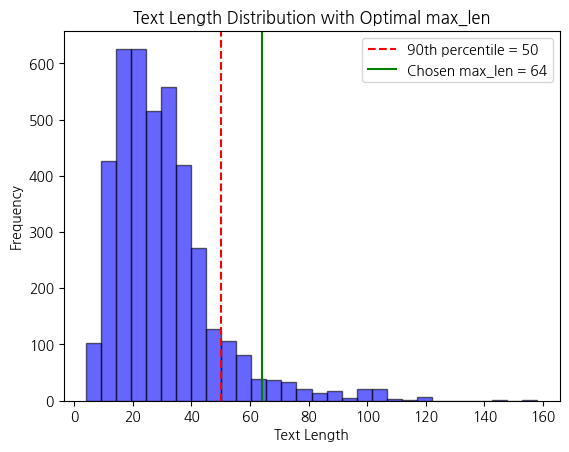

In [39]:
# max_len 길이 구하기
token_lengths = [len(tokenizer.encode(text)) for text in law_train["text"]]

# 최적의 max_len 계산
max_len = calculate_optimal_max_len(token_lengths)

In [40]:
from torch.utils.data import DataLoader, Dataset

# 1. 커스텀 데이터셋 정의
class CustomDataset(Dataset):
    def __init__(self, dataframe):
        self.data = dataframe
        # `text` 또는 `facts` 열 자동 선택
        self.column_name = 'text' if 'text' in dataframe.columns else 'facts'
        self.texts = self.data[self.column_name]

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        return self.texts.iloc[idx]
    
# 2. 데이터셋 준비
train_dataset = CustomDataset(law_train)
valid_dataset = CustomDataset(law_test)
test_dataset = CustomDataset(lbox_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [41]:
# 3. 임베딩 생성 함수
def generate_embeddings(data_loader):
    embeddings = []
    model.eval()
    with torch.no_grad():
        for batch in data_loader:
            inputs = tokenizer(list(batch), return_tensors="pt", padding=True, truncation=True, max_length=max_len).to("cuda")
            outputs = model(**inputs)
            cls_embeddings = outputs.last_hidden_state[:, 0, :]  # [CLS] 토큰의 임베딩 사용
            embeddings.append(cls_embeddings.cpu())
    return torch.cat(embeddings).numpy()

# 데이터 임베딩 생성
train_embeddings = generate_embeddings(train_loader)
valid_embeddings = generate_embeddings(valid_loader)
test_embeddings = generate_embeddings(test_loader)

In [42]:
train_embeddings[:,]

array([[ 0.12480664, -0.6515409 , -0.13723978, ..., -0.15488873,
        -0.13904525,  0.15338817],
       [ 0.17775053, -0.6243988 , -0.1896124 , ..., -0.06340826,
        -0.09460855,  0.13516207],
       [ 0.18604118, -0.6582058 , -0.18260281, ..., -0.09434335,
        -0.10856118,  0.07603566],
       ...,
       [ 0.10944928, -0.6528541 , -0.15339245, ...,  0.00840542,
        -0.16399294,  0.11931564],
       [ 0.04561797, -0.5922253 , -0.19238158, ..., -0.00405112,
        -0.15427777,  0.19347847],
       [ 0.08532043, -0.6910479 , -0.23065807, ..., -0.08147041,
        -0.1294758 ,  0.08173345]], dtype=float32)

## 3. base visualization

### distance

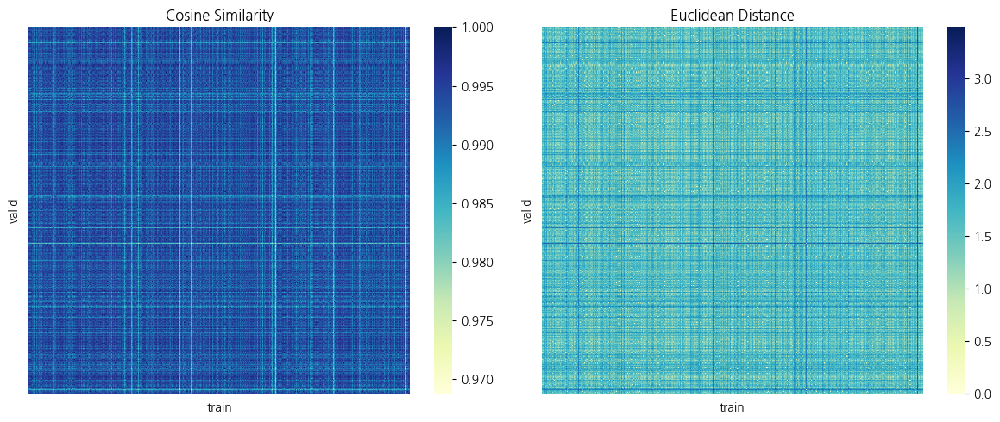

In [43]:
visualize_similarity_distance(train_embeddings, valid_embeddings, 'train', 'valid')

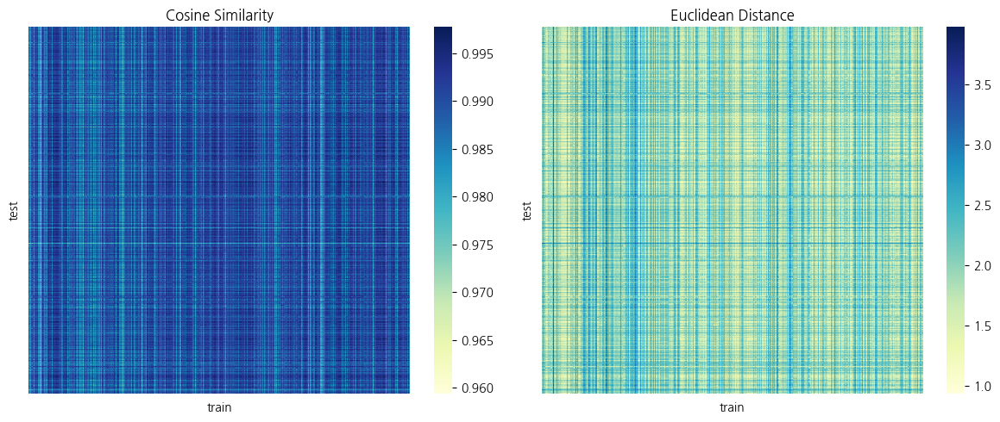

In [44]:
visualize_similarity_distance(train_embeddings, test_embeddings, 'train', 'test')

### plot without dimension reduction

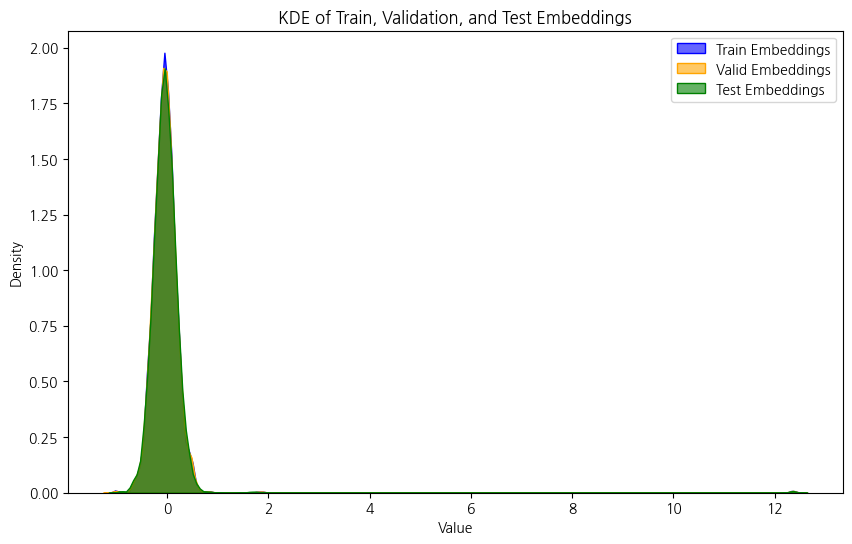

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

# 2D 배열을 1D 배열로 변환
train_embeddings_flat = train_embeddings.flatten()
valid_embeddings_flat = valid_embeddings.flatten()
test_embeddings_flat = test_embeddings.flatten()

# KDE (Kernel Density Estimation) 플롯으로 시각화
plt.figure(figsize=(10, 6))

sns.kdeplot(train_embeddings_flat, shade=True, color='blue', label='Train Embeddings', alpha=0.6)
sns.kdeplot(valid_embeddings_flat, shade=True, color='orange', label='Valid Embeddings', alpha=0.6)
sns.kdeplot(test_embeddings_flat, shade=True, color='green', label='Test Embeddings', alpha=0.6)

# 라벨 및 제목 설정
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('KDE of Train, Validation, and Test Embeddings')
plt.legend()

# 시각화 표시
plt.show()


## 4. Dimension Reduction

### settings

In [46]:
from scipy.stats import ks_2samp

def run_kstest(train_data, test_data, feature_idx=0):
    """
    Kolmogorov-Smirnov Test를 실행하여 두 데이터 분포가 동일한지 검정.
    
    Parameters:
        train_data (ndarray): 첫 번째 데이터셋 (예: Train)
        test_data (ndarray): 두 번째 데이터셋 (예: Test)
        feature_idx (int): 비교할 주성분의 인덱스 (기본값: 0)
    
    Returns:
        ks_statistic (float): KS 통계량
        p_value (float): p-value 값
    """
    # 특정 주성분 (feature_idx) 선택
    train_feature = train_data[:, feature_idx]
    test_feature = test_data[:, feature_idx]

    # KS-Test 수행
    ks_statistic, p_value = ks_2samp(train_feature, test_feature)

    return ks_statistic, p_value

In [47]:
def find_elbow_point(variance_ratios):
    differences = np.diff(variance_ratios)  # 1차 미분 계산
    elbow_point = np.argmax(differences < 0.001) + 1  # 변화량이 0.01 이하로 감소하는 첫 번째 지점
    return elbow_point

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

def plot_reduced(train_reduced, valid_reduced, label1="Train", label2="Valid"):
    """
    차원 축소된 Train과 Valid 데이터를 입력으로 받아 주성분 분석 결과를 시각화.

    Parameters:
    - train_reduced: 차원 축소된 Train 데이터 (numpy array)
    - valid_reduced: 차원 축소된 Valid 데이터 (numpy array)
    - label1: Train 데이터 레이블 이름
    - label2: Valid 데이터 레이블 이름
    """
    # 병합된 데이터 생성
    embeddings = np.vstack([train_reduced, valid_reduced])
    labels = [label1] * len(train_reduced) + [label2] * len(valid_reduced)

    print(visualize_similarity_distance(embeddings[:len(train_reduced)], embeddings[len(train_reduced):], 
                                        label1, label2))

    # 2D와 3D 데이터 추출
    embeddings_2d = embeddings[:, :2]  # 첫 2개 주성분
    embeddings_3d = embeddings[:, :3] if embeddings.shape[1] > 2 else None  # 첫 3개 주성분 (3D용)

    # 색상 설정 (Train: Orange, Valid: Blue)
    colors = {label1: "orange", label2: "blue"}

    # 2D Scatter Plot
    fig, axes = plt.subplots(1, 2 if embeddings_3d is None else 3, figsize=(18, 6))

    # 2D Scatter Plot
    for label, color in colors.items():
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        axes[0].scatter(
            embeddings_2d[idx, 0], embeddings_2d[idx, 1],
            alpha=0.7, label=label, s=20, c=color
        )
    axes[0].set_title("2D Scatter Plot", fontsize=15)
    axes[0].set_xlabel("Principal Component 1", fontsize=12)
    axes[0].set_ylabel("Principal Component 2", fontsize=12)
    axes[0].legend(loc="best", fontsize=12)
    axes[0].grid(alpha=0.3)

    # 2D Density Plot
    sns.kdeplot(
        x=embeddings_2d[:len(train_reduced), 0], y=embeddings_2d[:len(train_reduced), 1],
        ax=axes[1], fill=True, alpha=0.5, color=colors[label1], label=label1
    )
    sns.kdeplot(
        x=embeddings_2d[len(train_reduced):, 0], y=embeddings_2d[len(train_reduced):, 1],
        ax=axes[1], fill=True, alpha=0.5, color=colors[label2], label=label2
    )
    axes[1].set_title("2D Density Plot", fontsize=15)
    axes[1].set_xlabel("Principal Component 1", fontsize=12)
    axes[1].set_ylabel("Principal Component 2", fontsize=12)
    axes[1].legend(loc="best", fontsize=12)
    axes[1].grid(alpha=0.3)

    # 3D Scatter Plot (옵션)
    if embeddings_3d is not None:
        ax_3d = fig.add_subplot(133, projection='3d')
        for label, color in colors.items():
            idx = [i for i, lbl in enumerate(labels) if lbl == label]
            ax_3d.scatter(
                embeddings_3d[idx, 0], embeddings_3d[idx, 1], embeddings_3d[idx, 2],
                alpha=0.7, label=label, s=20, c=color
            )
        ax_3d.set_title("3D Scatter Plot", fontsize=15)
        ax_3d.set_xlabel("Principal Component 1", fontsize=12)
        ax_3d.set_ylabel("Principal Component 2", fontsize=12)
        ax_3d.set_zlabel("Principal Component 3", fontsize=12)
        ax_3d.legend(loc="best", fontsize=12)
        ax_3d.view_init(elev=20, azim=45)  # 3D 카메라 각도 조정

    # 전체 레이아웃 정리
    plt.tight_layout()
    plt.show()

In [49]:
from sklearn.metrics import pairwise_distances
from scipy.stats import pearsonr

def calculate_distance_preservation(original_data, reduced_data):
    """
    Calculate pairwise distance preservation between original and reduced data.

    Parameters:
    - original_data (np.ndarray): High-dimensional data.
    - reduced_data (np.ndarray): Low-dimensional data.

    Returns:
    - preservation_score (float): Correlation coefficient indicating distance preservation.
    """
    # 원본 데이터와 축소 데이터의 거리 행렬 계산
    original_distances = pairwise_distances(original_data, metric='euclidean')
    reduced_distances = pairwise_distances(reduced_data, metric='euclidean')

    # 1차원 벡터로 펼치고 상관계수 계산
    preservation_score, _ = pearsonr(original_distances.ravel(), reduced_distances.ravel())
    return round(preservation_score, 4)

#### order

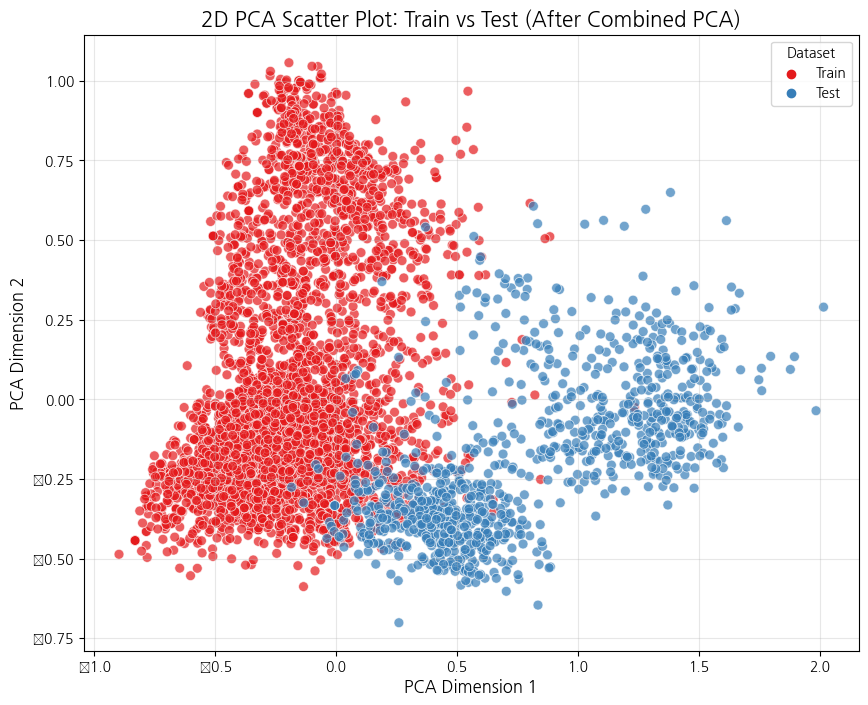

Explained variation per principle component : [0.14728765 0.08369547]


In [50]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Step 1: Train과 Test 데이터 병합
embeddings = np.vstack([train_embeddings, test_embeddings])  # Train과 Test 결합
labels = ["Train"] * len(train_embeddings) + ["Test"] * len(test_embeddings)  # 레이블 생성

# Step 2: PCA 적용
pca = PCA(n_components=2)  # 2개의 주성분으로 축소
embeddings_pca = pca.fit_transform(embeddings)

# Step 3: 시각화
x_2d, y_2d = embeddings_pca[:, 0], embeddings_pca[:, 1]  # 첫 2개의 주성분 추출

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=x_2d, y=y_2d, hue=labels, palette="Set1", alpha=0.7, s=50
)
plt.title("2D PCA Scatter Plot: Train vs Test (After Combined PCA)", fontsize=15)
plt.xlabel("PCA Dimension 1", fontsize=12)
plt.ylabel("PCA Dimension 2", fontsize=12)
plt.legend(title="Dataset")
plt.grid(alpha=0.3)
plt.show()

print("Explained variation per principle component : {}".format(pca.explained_variance_ratio_))


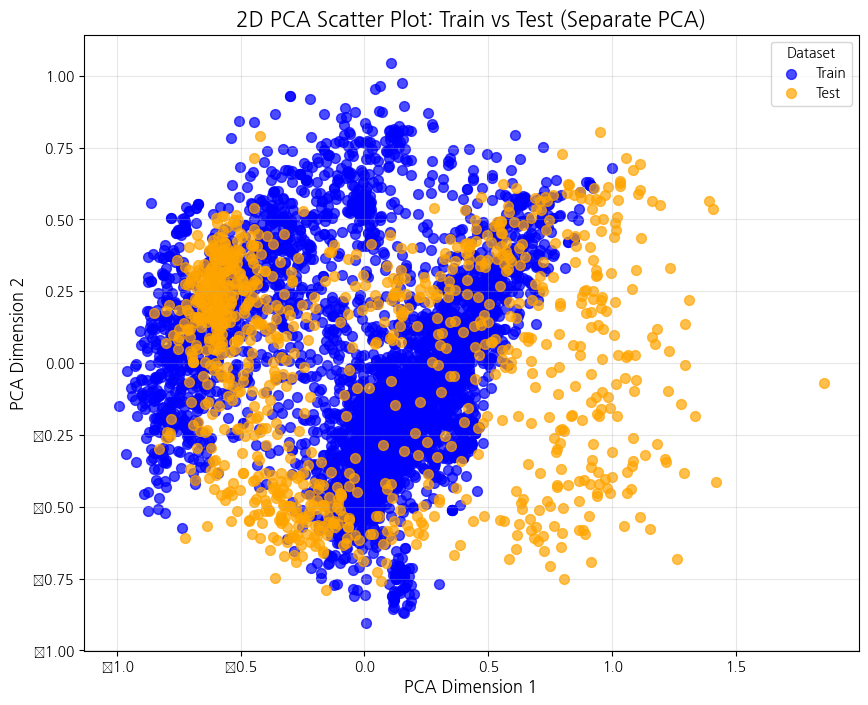

Explained variation per principle component : [0.14728765 0.08369547]


In [51]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Step 1: 각각 PCA 적용
pca_train = PCA(n_components=2)  # Train 데이터에 PCA 적용
ptrain_embeddings = pca_train.fit_transform(train_embeddings)

pca_test = PCA(n_components=2)  # Test 데이터에 PCA 적용
ptest_embeddings = pca_test.fit_transform(test_embeddings)

# Step 2: 시각화 준비
x_train, y_train = ptrain_embeddings[:, 0], ptrain_embeddings[:, 1]  # Train 데이터의 첫 2개 주성분
x_test, y_test = ptest_embeddings[:, 0], ptest_embeddings[:, 1]  # Test 데이터의 첫 2개 주성분

# Step 3: 시각화
plt.figure(figsize=(10, 8))
plt.scatter(x_train, y_train, alpha=0.7, label="Train", c='blue', s=50)
plt.scatter(x_test, y_test, alpha=0.7, label="Test", c='orange', s=50)
plt.title("2D PCA Scatter Plot: Train vs Test (Separate PCA)", fontsize=15)
plt.xlabel("PCA Dimension 1", fontsize=12)
plt.ylabel("PCA Dimension 2", fontsize=12)
plt.legend(title="Dataset")
plt.grid(alpha=0.3)
plt.show()

print("Explained variation per principle component : {}".format(pca.explained_variance_ratio_))


### 4.1 PCA

#### select dim

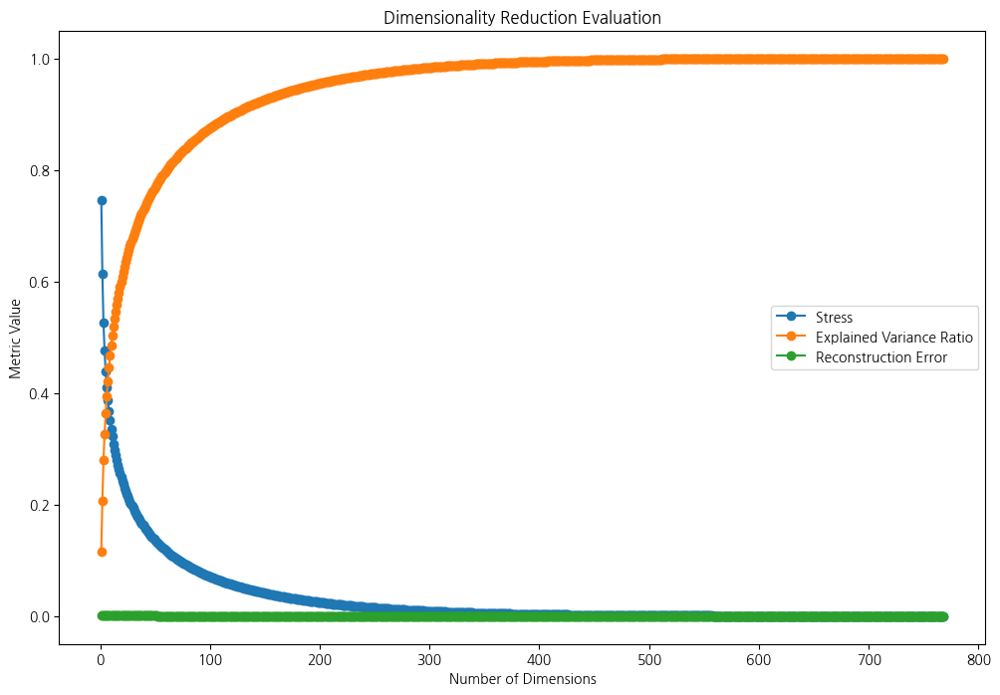

In [94]:
# Re-import necessary libraries and redefine the setup due to state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances

data = train_embeddings

# Dimensions and storage for metrics
dimensions = range(1, train_embeddings.shape[1]+1)
stress_vals, explained_variance_ratio_vals, reconstruction_error_vals = [], [], []

# High-dimensional distance computation
high_dim_distances = pairwise_distances(data)

# Dimensionality reduction and metric computation
for n in dimensions:
    pca = PCA(n_components=n)
    reduced_data = pca.fit_transform(data)
    
    # Stress calculation
    low_dim_distances = pairwise_distances(reduced_data)
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Explained Variance Ratio calculation
    explained_variance_ratio = np.sum(pca.explained_variance_ratio_)
    explained_variance_ratio_vals.append(explained_variance_ratio)
    
    # Reconstruction Error calculation
    reconstruction_error = np.mean((data - pca.inverse_transform(reduced_data)) ** 2)
    reconstruction_error_vals.append(reconstruction_error)

# Visualization of metrics
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, explained_variance_ratio_vals, label='Explained Variance Ratio', marker='o')
plt.plot(dimensions, reconstruction_error_vals, label='Reconstruction Error', marker='o')
# plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Stress Elbow Point')
# plt.axvline(x=dimensions[np.argmax(explained_variance_ratio_vals)], color='g', linestyle='--', label='Explained Variance Ratio Elbow Point')
# plt.axvline(x=dimensions[np.argmin(reconstruction_error_vals)], color='b', linestyle='--', label='Reconstruction Error Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [ ]:
from kneed import KneeLocator
import pandas as pd

dimensions=range(1, train_embeddings.shape[1]+1)

stress_point = KneeLocator(dimensions, stress_vals, curve="convex", direction="decreasing").knee
# explained_variance_point = KneeLocator(dimensions, explained_variance_ratio_vals, curve="concave", direction="increasing").knee
explained_variance_point = next((i for i, val in enumerate(explained_variance_ratio_vals) if val > 0.95), None)
reconstruction_error_point = KneeLocator(dimensions, reconstruction_error_vals, curve="convex", direction="decreasing").knee

stress_point, explained_variance_point, reconstruction_error_point

(93, 188, 115)

##### before

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import trustworthiness
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# 예제 데이터 생성
data = train_embeddings

# 지표 저장용 리스트
dimensions = range(1, 768, 5)
stress_vals, pearson_vals, trust_vals, lcmc_vals = [], [], [], []

# 고차원 거리 계산
high_dim_distances = pairwise_distances(data)

# 차원 축소 및 지표 계산
for n in dimensions:
    # PCA로 차원 축소
    pca = PCA(n_components=n)
    reduced_data = pca.fit_transform(data)

    # 저차원 거리 계산
    low_dim_distances = pairwise_distances(reduced_data)
    
    # Stress 계산
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Pearson Correlation 계산
    pearson_corr, _ = pearsonr(high_dim_distances.flatten(), low_dim_distances.flatten())
    pearson_vals.append(pearson_corr)

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, pearson_vals, label='Pearson Correlation', marker='o')
plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()


In [ ]:
tolerance = 0.001

# Stress 안정 구간 계산
stress_deltas = np.abs(np.diff(stress_vals))
stress_stable_indices = np.where(stress_deltas < tolerance)[0] + 1
stress_stable_range = dimensions[min(stress_stable_indices): max(stress_stable_indices)+1] if len(stress_stable_indices) > 0 else []

# Pearson Correlation 안정 구간 계산
pearson_deltas = np.abs(np.diff(pearson_vals))
pearson_stable_indices = np.where(pearson_deltas < tolerance)[0] + 1
pearson_stable_range = dimensions[min(pearson_stable_indices): max(pearson_stable_indices)+1] if len(pearson_stable_indices) > 0 else []

# 공통적으로 겹치는 차원 구간 계산
common_range = set(stress_stable_range).intersection(
    pearson_stable_range,
)

# 결과 데이터프레임 생성
result_df = pd.DataFrame([
    {"Metric": "Stress", "Stable Range Start": min(stress_stable_range) if stress_stable_range else None,
     "Stable Range End": max(stress_stable_range) if stress_stable_range else None},
    {"Metric": "Pearson Correlation", "Stable Range Start": min(pearson_stable_range) if pearson_stable_range else None,
     "Stable Range End": max(pearson_stable_range) if pearson_stable_range else None},
    {"Metric": "Common Stable Range", "Stable Range Start": min(common_range) if common_range else None,
     "Stable Range End": max(common_range) if common_range else None}
])

result_df

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pandas as pd

# Train 데이터셋만 사용
data = train_embeddings

# 결과 저장용 변수
explained_variance = {}
reconstruction_errors = []

# PCA 모델 생성 및 훈련
pca = PCA().fit(data)

# Explained Variance Ratio 계산
explained_variance["Cumulative Explained Variance"] = pca.explained_variance_ratio_.cumsum()

# 다양한 컴포넌트 수에 대해 Reconstruction Error 계산
for n_components in range(1, data.shape[1] + 1):  # 1부터 데이터 차원까지 반복
    pca_temp = PCA(n_components=n_components).fit(data)
    reduced_data = pca_temp.transform(data)  # 차원 축소
    reconstructed_data = pca_temp.inverse_transform(reduced_data)  # 데이터 복원
    mse = np.mean((data - reconstructed_data) ** 2)  # Reconstruction Error 계산
    reconstruction_errors.append(mse)

# 엘보우 포인트 계산 (Explained Variance)
elbow_point_variance = np.argmax(np.diff(explained_variance["Cumulative Explained Variance"]) < 0.001) + 1

# 엘보우 포인트 계산 (Reconstruction Error)
elbow_point_reconstruction = np.argmin(np.diff(reconstruction_errors) > -0.001) + 1

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Explained Variance Ratio 그래프
axes[0].plot(range(1, len(explained_variance["Cumulative Explained Variance"]) + 1),
             explained_variance["Cumulative Explained Variance"], label="Cumulative Variance")
axes[0].scatter(elbow_point_variance,
                explained_variance["Cumulative Explained Variance"][elbow_point_variance - 1],
                color="red", label="Elbow Point")
axes[0].set_title("Explained Variance Ratio")
axes[0].set_xlabel("Number of Components")
axes[0].set_ylabel("Cumulative Explained Variance")
axes[0].grid()
axes[0].legend()

# # Reconstruction Error 그래프
# axes[1].plot(range(1, len(reconstruction_errors) + 1), reconstruction_errors, label="Reconstruction Error")
# axes[1].scatter(elbow_point_reconstruction, reconstruction_errors[elbow_point_reconstruction - 1], color="red", label="Elbow Point")
# axes[1].set_title("Reconstruction Error")
# axes[1].set_xlabel("Number of Components")
# axes[1].set_ylabel("Reconstruction Error")
# axes[1].grid()
# axes[1].legend()

# plt.tight_layout()
# plt.show()

# 데이터프레임 생성
components_info = {
    "Cumulative Explained Variance": explained_variance["Cumulative Explained Variance"][elbow_point_variance - 1],
    "Explained Variance Components": elbow_point_variance,
    "Reconstruction Error": reconstruction_errors[elbow_point_reconstruction - 1],
    "Reconstruction Components": elbow_point_reconstruction
}

# 데이터프레임 출력

components_df = pd.DataFrame([components_info])
components_df.index = ["Train"]
display(components_df)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from kneed import KneeLocator

# 데이터 준비
data = train_embeddings  # train_embeddings를 사용하세요

# Reconstruction Error를 저장할 리스트
dimensions = range(1, data.shape[1] + 1)
reconstruction_errors = []

# PCA 및 Reconstruction Error 계산
for n_components in dimensions:
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    reconstructed_data = pca.inverse_transform(reduced_data)
    reconstruction_error = np.mean((data - reconstructed_data) ** 2)  # Mean Squared Error
    reconstruction_errors.append(reconstruction_error)

# 엘보우 포인트 계산
kneedle = KneeLocator(dimensions, reconstruction_errors, curve="convex", direction="decreasing")
elbow_point = kneedle.knee

# 결과 출력 및 시각화
print(f"Optimal number of dimensions based on Elbow Point: {elbow_point}")

plt.figure(figsize=(10, 6))
plt.plot(dimensions, reconstruction_errors, marker='o', label="Reconstruction Error")
plt.axvline(x=elbow_point, color='r', linestyle='--', label=f"Elbow Point: {elbow_point}")
plt.xlabel("Number of Dimensions")
plt.ylabel("Reconstruction Error")
plt.title("PCA Reconstruction Error and Elbow Point")
plt.legend()
plt.grid()
plt.show()

#### excute dimension reduction

In [91]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 188)
pca.fit(train_embeddings)

train_pca = pca.transform(train_embeddings)
valid_pca = pca.transform(valid_embeddings)
test_pca = pca.transform(test_embeddings)

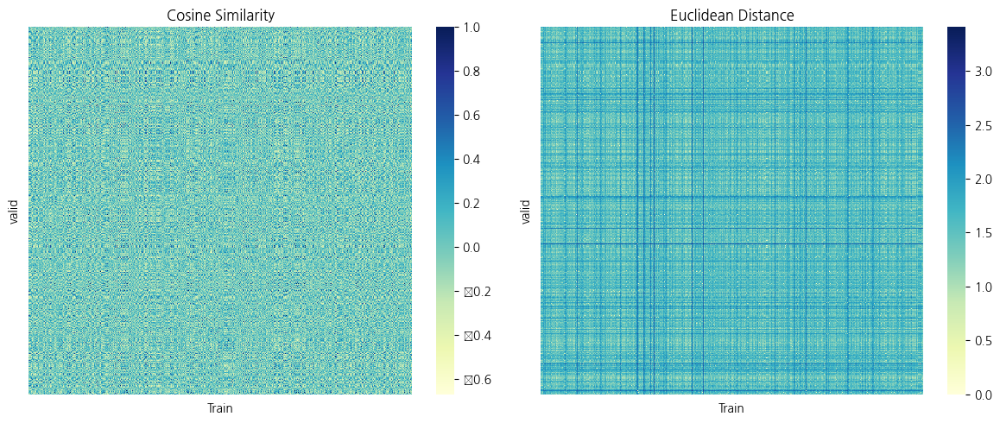

None


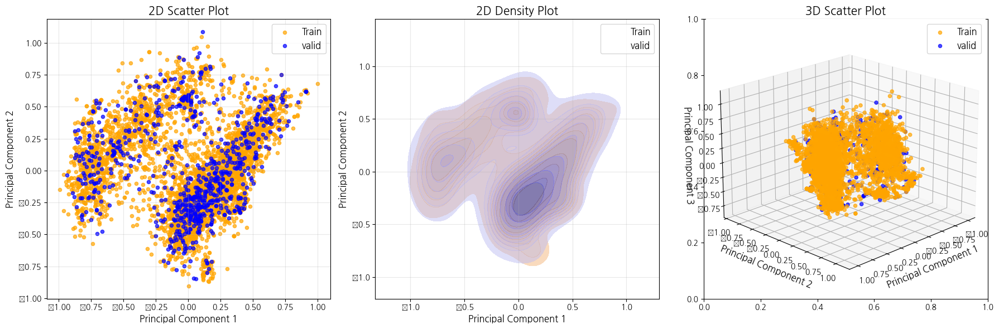

In [92]:
plot_reduced(train_pca, valid_pca, label1="Train", label2="valid")

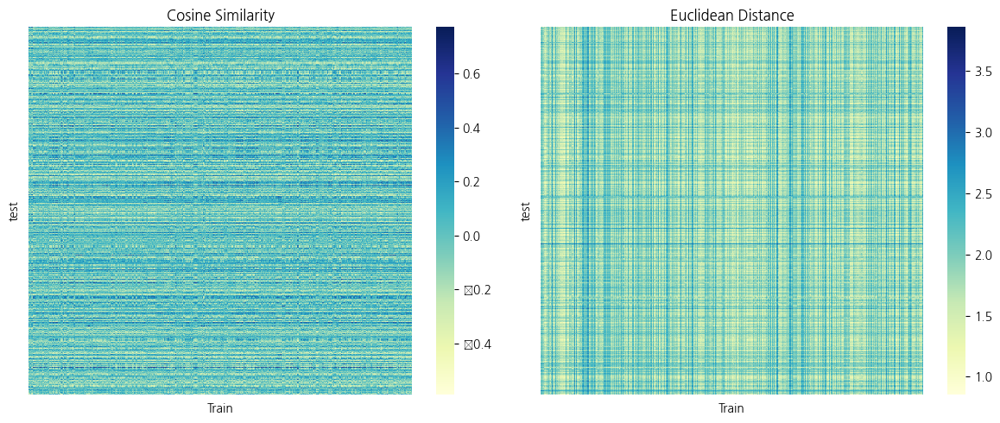

None


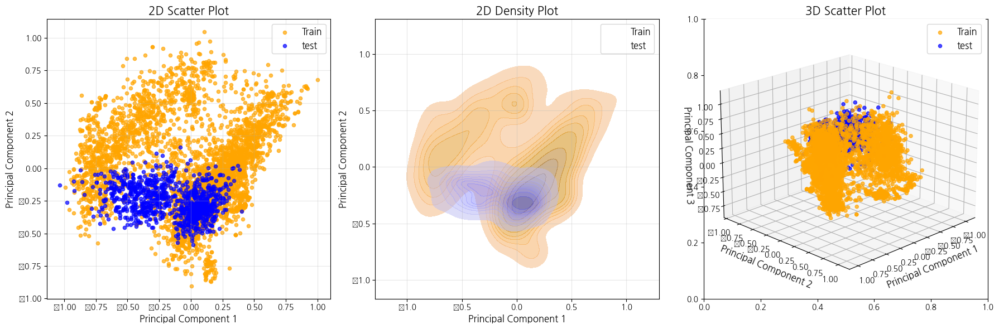

In [93]:
plot_reduced(train_pca, test_pca, label1="Train", label2="test")

In [ ]:
# KS-valid 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_pca, valid_pca, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 valid의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 valid의 분포 차이는 유의미하지 않습니다.")
    
print()

# KS-Test 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_pca, test_pca, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 Test의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 Test의 분포 차이는 유의미하지 않습니다.")

### 4.2 Kernel PCA

#### select dim

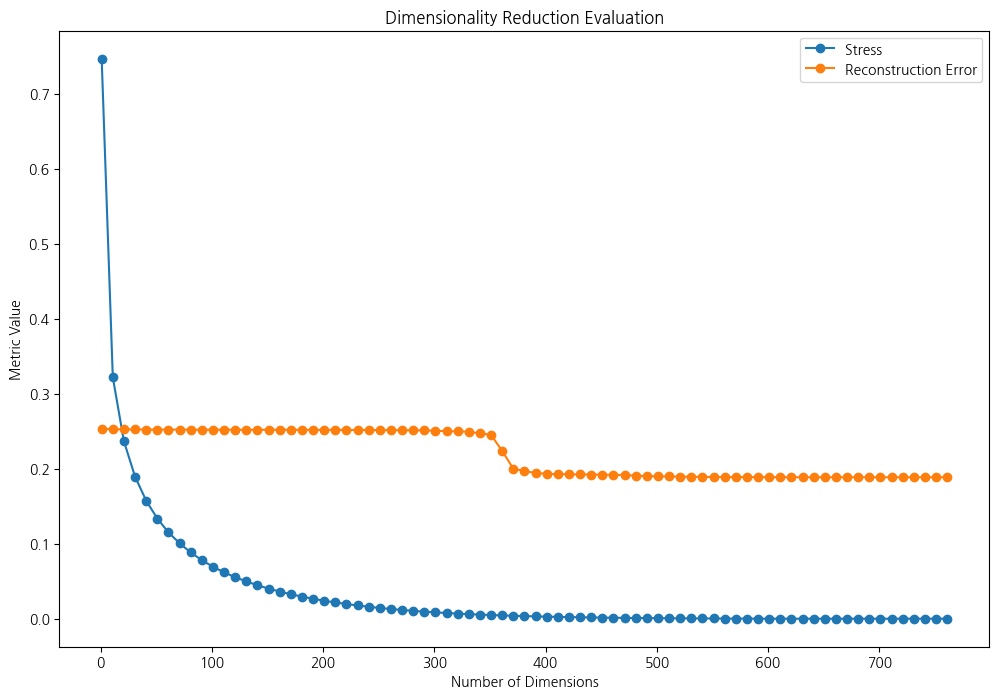

In [149]:
# Re-import necessary libraries and redefine the setup due to state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import KernelPCA
from sklearn.metrics import pairwise_distances

data = train_embeddings

# Dimensions and storage for metrics
dimensions = range(1, train_embeddings.shape[1]+1, 10)
stress_vals, explained_variance_ratio_vals, reconstruction_error_vals = [], [], []

# High-dimensional distance computation
high_dim_distances = pairwise_distances(data)

# Dimensionality reduction and metric computation
for n in dimensions:
    kernel_pca = KernelPCA(n_components=n, kernel='linear', fit_inverse_transform=True)
    reduced_data = kernel_pca.fit_transform(data)
    
    # Stress calculation
    low_dim_distances = pairwise_distances(reduced_data)
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Explained Variance Ratio calculation
   # explained_variance_ratio = np.sum(kernel_pca.explained_variance_ratio_)
   # explained_variance_ratio_vals.append(explained_variance_ratio)
    
    # Reconstruction Error calculation
    reconstruction_error = np.mean((data - kernel_pca.inverse_transform(reduced_data)) ** 2)
    reconstruction_error_vals.append(reconstruction_error)

# Visualization of metrics
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
# plt.plot(dimensions, explained_variance_ratio_vals, label='Explained Variance Ratio', marker='o')
plt.plot(dimensions, reconstruction_error_vals, label='Reconstruction Error', marker='o')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [159]:
from kneed import KneeLocator
import pandas as pd
from scipy.ndimage import gaussian_filter1d

# dimensions=range(1, train_embeddings.shape[1]+1)

stress_point = KneeLocator(dimensions, stress_vals, curve="convex", direction="decreasing").knee
# explained_variance_point = KneeLocator(dimensions, explained_variance_ratio_vals, curve="concave", direction="increasing").knee
# explained_variance_point = next((i for i, val in enumerate(explained_variance_ratio_vals) if val > 0.95), None)
reconstruction_error_point = KneeLocator(dimensions[10:], gaussian_filter1d(reconstruction_error_vals[10:], sigma=2), curve="convex", direction="decreasing").knee

stress_point, reconstruction_error_point

(91, 101)

##### before

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import KernelPCA
from sklearn.manifold import trustworthiness
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# 예제 데이터 생성
data = train_embeddings

# 지표 저장용 리스트
dimensions = range(1, 768, 5)
stress_vals, pearson_vals, trust_vals, lcmc_vals = [], [], [], []

# 고차원 거리 계산
high_dim_distances = pairwise_distances(data)

# 차원 축소 및 지표 계산
for n in dimensions:
    # PCA로 차원 축소
    kernel_pca = KernelPCA(n_components=n)
    reduced_data = kernel_pca.fit_transform(data)

    # 저차원 거리 계산
    low_dim_distances = pairwise_distances(reduced_data)
    
    # Stress 계산
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Pearson Correlation 계산
    pearson_corr, _ = pearsonr(high_dim_distances.flatten(), low_dim_distances.flatten())
    pearson_vals.append(pearson_corr)

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, pearson_vals, label='Pearson Correlation', marker='o')
plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()


In [ ]:
tolerance = 0.001

# Stress 안정 구간 계산
stress_deltas = np.abs(np.diff(stress_vals))
stress_stable_indices = np.where(stress_deltas < tolerance)[0] + 1
stress_stable_range = dimensions[min(stress_stable_indices): max(stress_stable_indices)+1] if len(stress_stable_indices) > 0 else []

# Pearson Correlation 안정 구간 계산
pearson_deltas = np.abs(np.diff(pearson_vals))
pearson_stable_indices = np.where(pearson_deltas < tolerance)[0] + 1
pearson_stable_range = dimensions[min(pearson_stable_indices): max(pearson_stable_indices)+1] if len(pearson_stable_indices) > 0 else []

# 공통적으로 겹치는 차원 구간 계산
common_range = set(stress_stable_range).intersection(
    pearson_stable_range,
)

# 결과 데이터프레임 생성
result_df = pd.DataFrame([
    {"Metric": "Stress", "Stable Range Start": min(stress_stable_range) if stress_stable_range else None,
     "Stable Range End": max(stress_stable_range) if stress_stable_range else None},
    {"Metric": "Pearson Correlation", "Stable Range Start": min(pearson_stable_range) if pearson_stable_range else None,
     "Stable Range End": max(pearson_stable_range) if pearson_stable_range else None},
    {"Metric": "Common Stable Range", "Stable Range Start": min(common_range) if common_range else None,
     "Stable Range End": max(common_range) if common_range else None}
])

result_df

In [ ]:
from sklearn.decomposition import KernelPCA

# 데이터 리스트
datasets = {
    "Train": train_embeddings,
    "Validation": valid_embeddings,
    "Test": test_embeddings
}

# 결과 저장용 리스트
reconstruction_errors = {}

# 차원 수를 달리하며 Kernel PCA 적용
for name, data in datasets.items():
    errors = []
    for n in range(1, data.shape[1] + 1):  # 모든 주성분 실험
        kpca = KernelPCA(n_components=n, kernel='rbf', gamma=0.1, fit_inverse_transform=True)
        transformed_data = kpca.fit_transform(data)
        reconstructed_data = kpca.inverse_transform(transformed_data)
        error = np.mean((data - reconstructed_data) ** 2)  # 재구성 오류
        errors.append(error)
    reconstruction_errors[name] = errors

# 시각화
fig, axes = plt.subplots(1, len(datasets), figsize=(18, 6))

for idx, (name, errors) in enumerate(reconstruction_errors.items()):
    axes[idx].plot(range(1, len(errors) + 1), errors)
    axes[idx].set_title(f"{name} Dataset (Reconstruction Error)")
    axes[idx].set_xlabel("Number of Components")
    axes[idx].set_ylabel("Mean Reconstruction Error")
    axes[idx].grid()

plt.tight_layout()
plt.show()


In [ ]:
from kneed import KneeLocator
import numpy as np
import matplotlib.pyplot as plt

# Train 데이터의 재구성 오류 리스트를 사용
errors = reconstruction_errors["Train"]  # Train 데이터에서의 재구성 오류 리스트

# 엘보 포인트 탐지
x = range(1, len(errors) + 1)  # 컴포넌트 개수
knee_locator = KneeLocator(x, errors, curve="convex", direction="decreasing")  # kneed를 활용한 탐지

# 엘보 포인트 출력
elbow_point = knee_locator.knee
print(f"Elbow point occurs at number of components: {elbow_point}")

# 시각화
plt.figure(figsize=(8, 6))
plt.plot(x, errors, label="Reconstruction Error", color="blue")
plt.axvline(x=elbow_point, color="red", linestyle="--", label=f"Elbow Point: {elbow_point}")
plt.title("Elbow Point Detection")
plt.xlabel("Number of Components")
plt.ylabel("Mean Reconstruction Error")
plt.legend()
plt.grid()
plt.show()


#### excute dimension reduction

In [161]:
from sklearn.decomposition import KernelPCA

kernel_pca = KernelPCA(n_components = 101, kernel='cosine', fit_inverse_transform=True)
kernel_pca.fit(train_embeddings)

train_kernel_pca = kernel_pca.transform(train_embeddings)
valid_kernel_pca = kernel_pca.transform(valid_embeddings)
test_kernel_pca = kernel_pca.transform(test_embeddings)

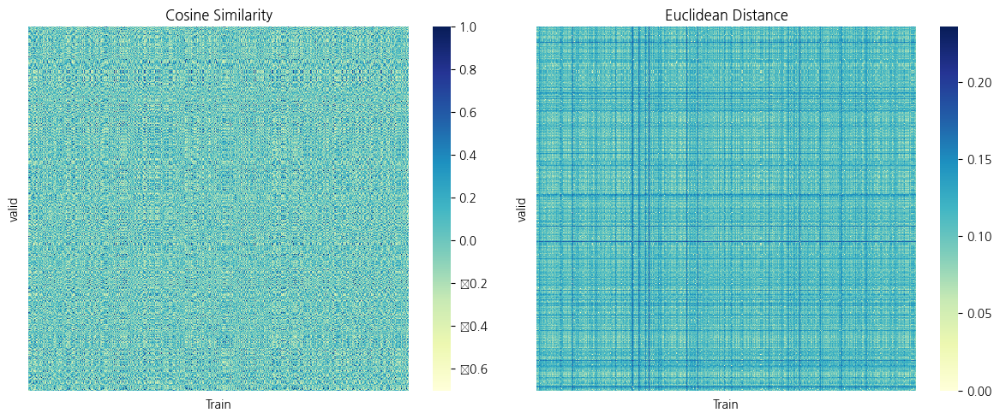

None


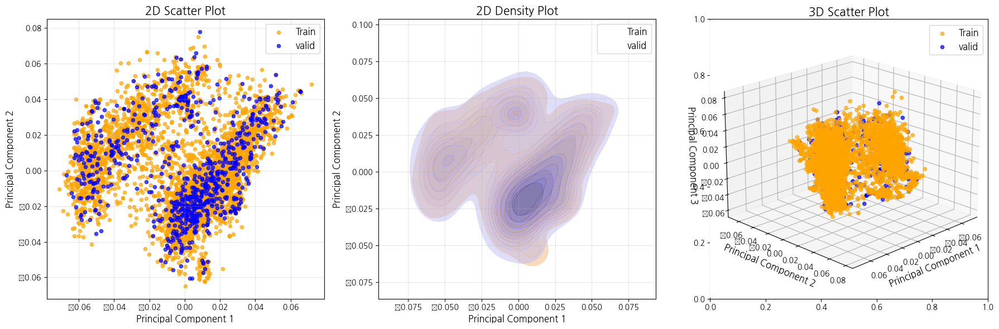

In [162]:
plot_reduced(train_kernel_pca, valid_kernel_pca, label1="Train", label2="valid")

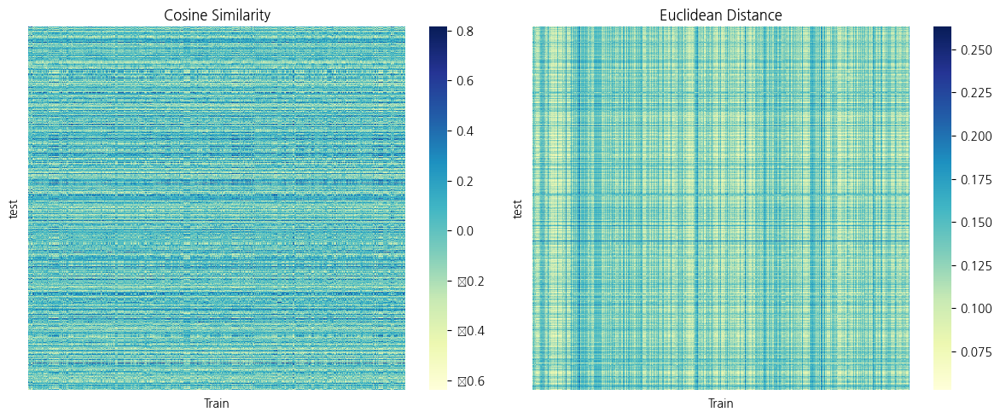

None


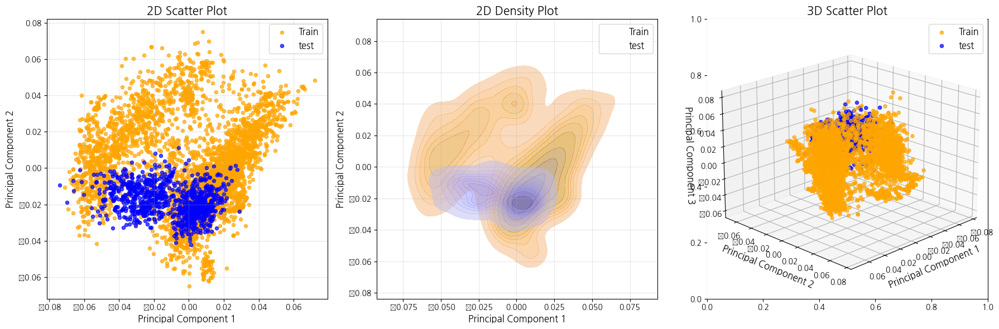

In [163]:
plot_reduced(train_kernel_pca, test_kernel_pca, label1="Train", label2="test")

#### KStest

In [ ]:
# KS-valid 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_kernel_pca, valid_kernel_pca, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 valid의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 valid의 분포 차이는 유의미하지 않습니다.")
    
print()

# KS-Test 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_kernel_pca, test_kernel_pca, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 Test의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 Test의 분포 차이는 유의미하지 않습니다.")

### 4.3 SVD

#### select dim

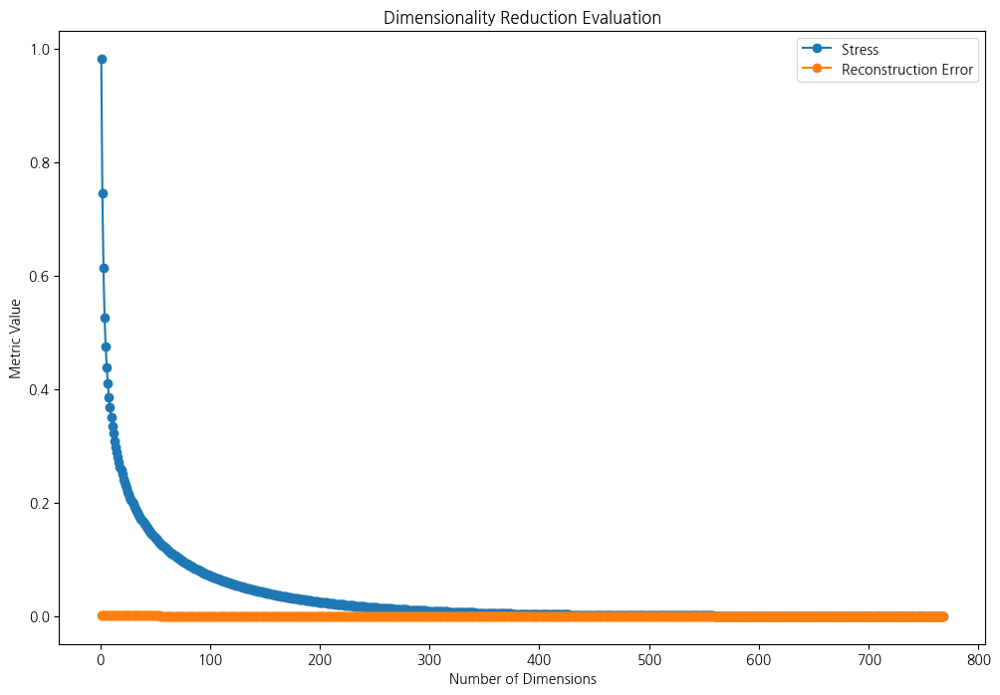

In [ ]:
# Re-import necessary libraries and redefine the setup due to state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import pairwise_distances

data = train_embeddings

# Dimensions and storage for metrics
dimensions = range(1, train_embeddings.shape[1]+1)
stress_vals, explained_variance_ratio_vals, reconstruction_error_vals = [], [], []

# High-dimensional distance computation
high_dim_distances = pairwise_distances(data)

# Dimensionality reduction and metric computation
for n in dimensions:
    svd = TruncatedSVD(n_components=n)
    reduced_data = svd.fit_transform(data)
    
    # Stress calculation
    low_dim_distances = pairwise_distances(reduced_data)
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Explained Variance Ratio calculation
    explained_variance_ratio = np.sum(svd.explained_variance_ratio_)
    explained_variance_ratio_vals.append(explained_variance_ratio)
    
    # Reconstruction Error calculation
    reconstruction_error = np.mean((data - svd.inverse_transform(reduced_data)) ** 2)
    reconstruction_error_vals.append(reconstruction_error)

# Visualization of metrics
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
# plt.plot(dimensions, explained_variance_ratio_vals, label='Explained Variance Ratio', marker='o')
plt.plot(dimensions, reconstruction_error_vals, label='Reconstruction Error', marker='o')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [ ]:
from kneed import KneeLocator
import pandas as pd

dimensions=range(1, train_embeddings.shape[1]+1)

stress_point = KneeLocator(dimensions, stress_vals, curve="convex", direction="decreasing").knee
#explained_variance_point = KneeLocator(dimensions, explained_variance_ratio_vals, curve="concave", direction="increasing").knee
explained_variance_point = next((i for i, val in enumerate(explained_variance_ratio_vals) if val > 0.95), None)
reconstruction_error_point = KneeLocator(dimensions, reconstruction_error_vals, curve="convex", direction="decreasing").knee

stress_point, reconstruction_error_point

(75, 111)

##### before

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import trustworthiness
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# 예제 데이터 생성
data = train_embeddings

# 지표 저장용 리스트
dimensions = range(1, 768, 5)
stress_vals, pearson_vals, trust_vals, lcmc_vals = [], [], [], []

# 고차원 거리 계산
high_dim_distances = pairwise_distances(data)

# 차원 축소 및 지표 계산
for n in dimensions:
    # PCA로 차원 축소
    svd = TruncatedSVD(n_components=n)
    reduced_data = svd.fit_transform(data)

    # 저차원 거리 계산
    low_dim_distances = pairwise_distances(reduced_data)
    
    # Stress 계산
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Pearson Correlation 계산
    pearson_corr, _ = pearsonr(high_dim_distances.flatten(), low_dim_distances.flatten())
    pearson_vals.append(pearson_corr)

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, pearson_vals, label='Pearson Correlation', marker='o')
plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [ ]:
tolerance = 0.001

# Stress 안정 구간 계산
stress_deltas = np.abs(np.diff(stress_vals))
stress_stable_indices = np.where(stress_deltas < tolerance)[0] + 1
stress_stable_range = dimensions[min(stress_stable_indices): max(stress_stable_indices)+1] if len(stress_stable_indices) > 0 else []

# Pearson Correlation 안정 구간 계산
pearson_deltas = np.abs(np.diff(pearson_vals))
pearson_stable_indices = np.where(pearson_deltas < tolerance)[0] + 1
pearson_stable_range = dimensions[min(pearson_stable_indices): max(pearson_stable_indices)+1] if len(pearson_stable_indices) > 0 else []

# 공통적으로 겹치는 차원 구간 계산
common_range = set(stress_stable_range).intersection(
    pearson_stable_range,
)

# 결과 데이터프레임 생성
result_df = pd.DataFrame([
    {"Metric": "Stress", "Stable Range Start": min(stress_stable_range) if stress_stable_range else None,
     "Stable Range End": max(stress_stable_range) if stress_stable_range else None},
    {"Metric": "Pearson Correlation", "Stable Range Start": min(pearson_stable_range) if pearson_stable_range else None,
     "Stable Range End": max(pearson_stable_range) if pearson_stable_range else None},
    {"Metric": "Common Stable Range", "Stable Range Start": min(common_range) if common_range else None,
     "Stable Range End": max(common_range) if common_range else None}
])

result_df

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from kneed import KneeLocator

# 데이터 준비
data = train_embeddings  # train_embeddings를 사용하세요

# Reconstruction Error를 저장할 리스트
dimensions = range(1, data.shape[1] + 1)
reconstruction_errors = []

# TruncatedSVD 및 Reconstruction Error 계산
for n_components in dimensions:
    svd = TruncatedSVD(n_components=n_components)
    reduced_data = svd.fit_transform(data)
    
    # 복원된 데이터 계산 (SVD의 특성상 근사 복원을 위해 np.dot 사용)
    reconstructed_data = np.dot(reduced_data, svd.components_)
    
    # Reconstruction Error 계산 (MSE)
    reconstruction_error = np.mean((data - reconstructed_data) ** 2)
    reconstruction_errors.append(reconstruction_error)

# 엘보우 포인트 계산
kneedle = KneeLocator(dimensions, reconstruction_errors, curve="convex", direction="decreasing")
elbow_point = kneedle.knee

# 결과 출력 및 시각화
print(f"Optimal number of dimensions based on Elbow Point (Truncated SVD): {elbow_point}")

plt.figure(figsize=(10, 6))
plt.plot(dimensions, reconstruction_errors, marker='o', label="Reconstruction Error")
plt.axvline(x=elbow_point, color='r', linestyle='--', label=f"Elbow Point: {elbow_point}")
plt.xlabel("Number of Dimensions")
plt.ylabel("Reconstruction Error")
plt.title("Truncated SVD Reconstruction Error and Elbow Point")
plt.legend()
plt.grid()
plt.show()


#### excute dimension reduction

In [100]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components = 111)

svd.fit(train_embeddings)

train_svd = svd.transform(train_embeddings)
valid_svd = svd.transform(valid_embeddings)
test_svd = svd.transform(test_embeddings)

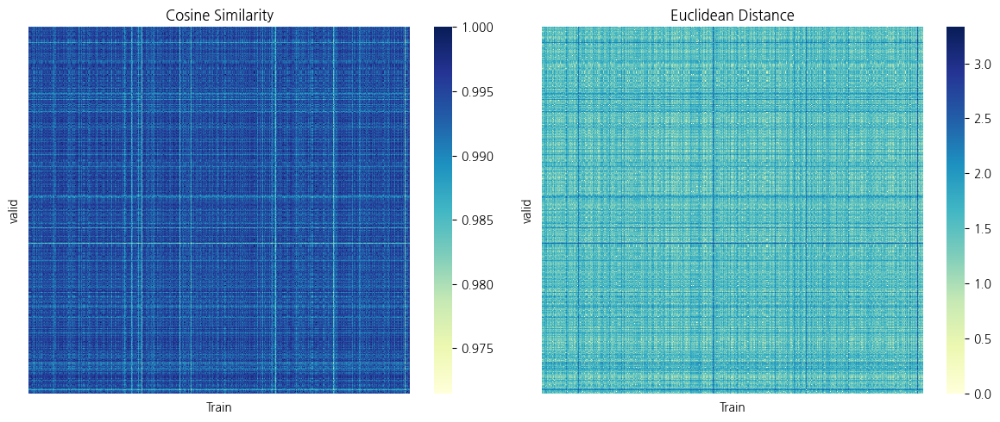

None


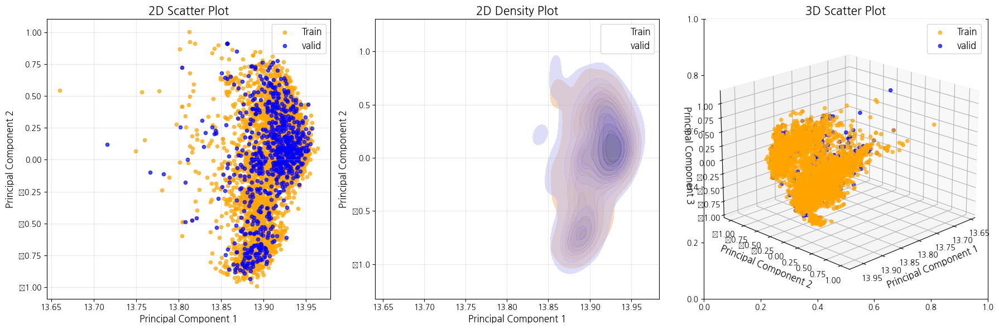

In [101]:
plot_reduced(train_svd, valid_svd, label1="Train", label2="valid")

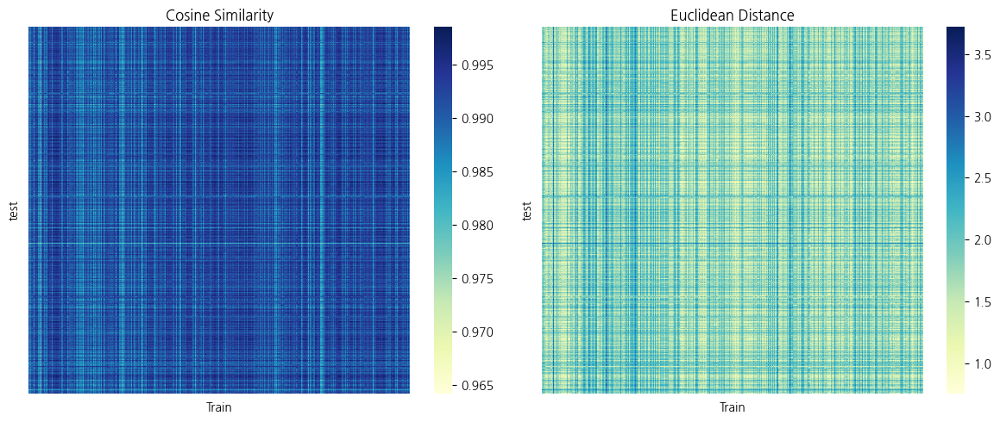

None


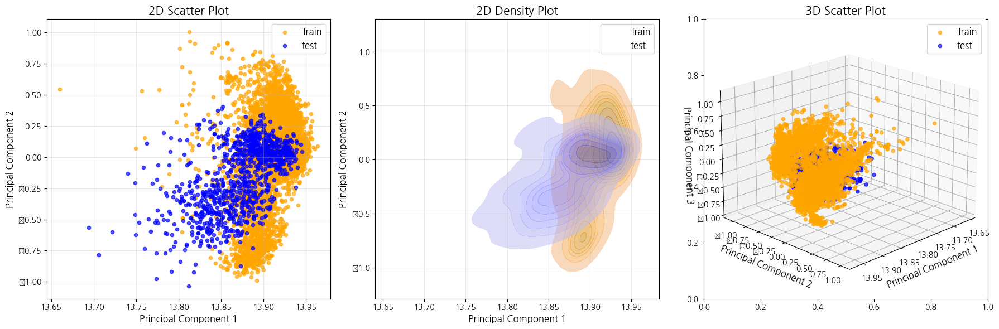

In [102]:
plot_reduced(train_svd, test_svd, label1="Train", label2="test")

#### KStest

In [ ]:
# KS-valid 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_svd, valid_svd, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 valid의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 valid의 분포 차이는 유의미하지 않습니다.")
    
print()

# KS-Test 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_svd, test_svd, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 Test의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 Test의 분포 차이는 유의미하지 않습니다.")

### 4.4 GRP

#### select dim

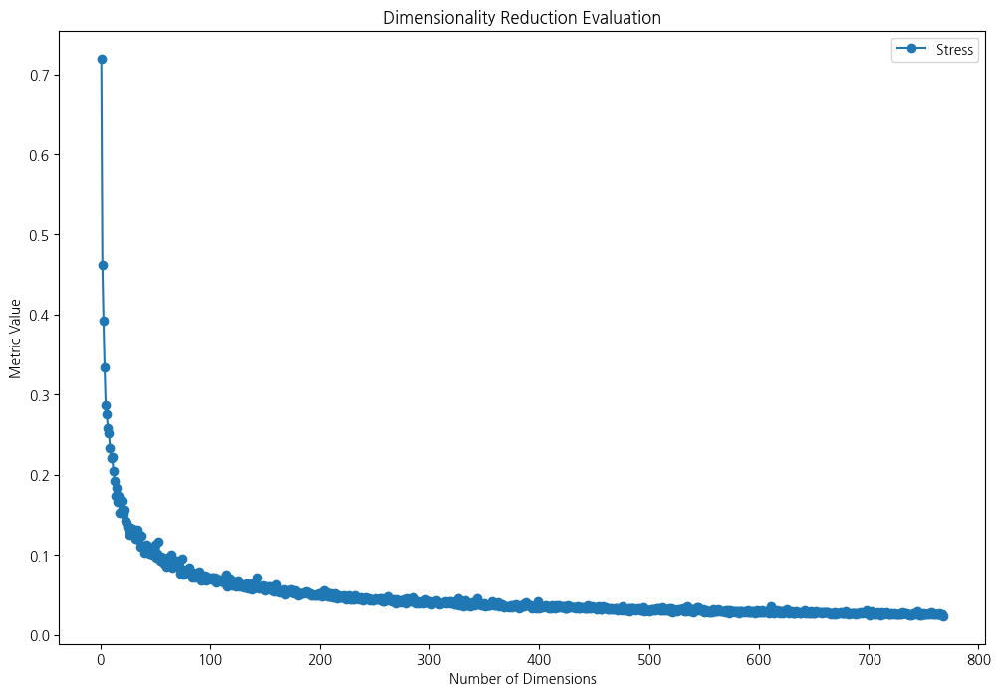

In [117]:
# Re-import necessary libraries and redefine the setup due to state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.random_projection import GaussianRandomProjection
from sklearn.metrics import pairwise_distances

data = train_embeddings

# Dimensions and storage for metrics
dimensions = range(1, train_embeddings.shape[1]+1)
stress_vals, explained_variance_ratio_vals, reconstruction_error_vals = [], [], []

# High-dimensional distance computation
high_dim_distances = pairwise_distances(data)

# Dimensionality reduction and metric computation
for n in dimensions:
    grp = GaussianRandomProjection(n_components=n)
    reduced_data = grp.fit_transform(data)
    
    # Stress calculation
    low_dim_distances = pairwise_distances(reduced_data)
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # # Explained Variance Ratio calculation
    # explained_variance_ratio = np.sum(grp.explained_variance_ratio_)
    # explained_variance_ratio_vals.append(explained_variance_ratio)
    
    # # Reconstruction Error calculation
    # reconstruction_error = np.mean((data - grp.inverse_transform(reduced_data)) ** 2)
    # reconstruction_error_vals.append(reconstruction_error)

# Visualization of metrics
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
# plt.plot(dimensions, explained_variance_ratio_vals, label='Explained Variance Ratio', marker='o')
# plt.plot(dimensions, reconstruction_error_vals, label='Reconstruction Error', marker='o')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

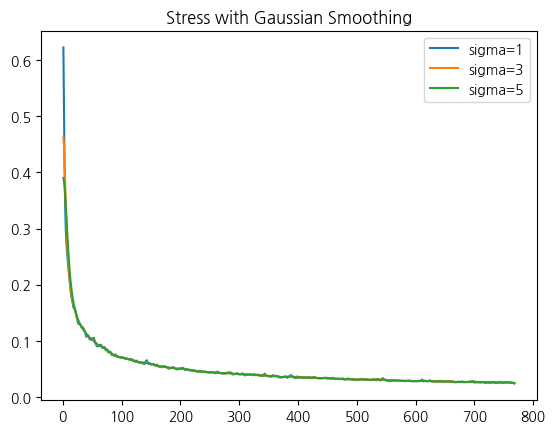

In [141]:
from scipy.ndimage import gaussian_filter1d

for sigma in [1, 3, 5]:
    smoothed_stress = gaussian_filter1d(stress_vals, sigma=sigma)
    plt.plot(dimensions, smoothed_stress, label=f'sigma={sigma}')
plt.legend()
plt.title("Stress with Gaussian Smoothing")
plt.show()

> 커브의 매끄러움을 높이기 위해 Stress 값을 스무딩 처리한 후 적용

**일반적인 sigma 값 범위**
0.5 ~ 2
미세한 노이즈를 제거하면서 원래 데이터의 패턴을 유지
대부분의 그래프 스무딩 작업에 적합

2 ~ 5
중간 정도의 스무딩. 더 큰 변동성을 제거하면서 여전히 주요 추세를 보존
복잡한 곡선에서 엘보우를 더 명확히 하고 싶을 때 사용

5 이상
매우 강한 스무딩. 그래프가 평탄화되어 세부적인 변화를 잃을 수 있음
극도로 노이즈가 많은 데이터에만 적합하며, 보통 권장되지 않음

In [144]:
from scipy.ndimage import gaussian_filter1d
from kneed import KneeLocator
import pandas as pd

dimensions=range(1, train_embeddings.shape[1]+1)
smoothed_stress = gaussian_filter1d(stress_vals, sigma=5) 

# valid_range = dimensions  
#valid_stress_vals = stress_vals

kneedle = KneeLocator(dimensions, smoothed_stress, curve='convex', direction='decreasing')
kneedle.knee

88

##### before

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import trustworthiness
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# 예제 데이터 생성
data = train_embeddings

# 지표 저장용 리스트
dimensions = range(1, 768, 5)
stress_vals, pearson_vals, trust_vals, lcmc_vals = [], [], [], []

# 고차원 거리 계산
high_dim_distances = pairwise_distances(data)

# 차원 축소 및 지표 계산
for n in dimensions:
    # PCA로 차원 축소
    grp = GaussianRandomProjection(n_components=n)
    reduced_data = grp.fit_transform(data)

    # 저차원 거리 계산
    low_dim_distances = pairwise_distances(reduced_data)
    
    # Stress 계산
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Pearson Correlation 계산
    pearson_corr, _ = pearsonr(high_dim_distances.flatten(), low_dim_distances.flatten())
    pearson_vals.append(pearson_corr)

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, pearson_vals, label='Pearson Correlation', marker='o')
plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [ ]:
tolerance = 0.001

# Stress 안정 구간 계산
stress_deltas = np.abs(np.diff(stress_vals))
stress_stable_indices = np.where(stress_deltas < tolerance)[0] + 1
stress_stable_range = dimensions[min(stress_stable_indices): max(stress_stable_indices)+1] if len(stress_stable_indices) > 0 else []

# Pearson Correlation 안정 구간 계산
pearson_deltas = np.abs(np.diff(pearson_vals))
pearson_stable_indices = np.where(pearson_deltas < tolerance)[0] + 1
pearson_stable_range = dimensions[min(pearson_stable_indices): max(pearson_stable_indices)+1] if len(pearson_stable_indices) > 0 else []

# 공통적으로 겹치는 차원 구간 계산
common_range = set(stress_stable_range).intersection(
    pearson_stable_range,
)

# 결과 데이터프레임 생성
result_df = pd.DataFrame([
    {"Metric": "Stress", "Stable Range Start": min(stress_stable_range) if stress_stable_range else None,
     "Stable Range End": max(stress_stable_range) if stress_stable_range else None},
    {"Metric": "Pearson Correlation", "Stable Range Start": min(pearson_stable_range) if pearson_stable_range else None,
     "Stable Range End": max(pearson_stable_range) if pearson_stable_range else None},
    {"Metric": "Common Stable Range", "Stable Range Start": min(common_range) if common_range else None,
     "Stable Range End": max(common_range) if common_range else None}
])

result_df

In [ ]:
import matplotlib.pyplot as plt
from sklearn.random_projection import GaussianRandomProjection
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import pandas as pd

# 데이터 리스트
datasets = {
    "Train": train_embeddings,
    "Validation": valid_embeddings,
    "Test": test_embeddings
}

# 결과 저장용 리스트
components_info = {}

# 시각화를 위한 그래프 준비
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 각 데이터셋에 대해 Gaussian Random Projection 수행
for idx, (name, data) in enumerate(datasets.items()):
    # 원본 데이터의 차원수
    original_dim = data.shape[1]
    
    # 변환된 데이터 간 유사성 저장
    similarities = []
    
    # 차원 축소를 위한 범위 설정 (768부터 10씩 감소)
    for n_components in range(original_dim, 1, -10):
        # Gaussian Random Projection 적용
        projection = GaussianRandomProjection(n_components=n_components)
        reduced_data = projection.fit_transform(data)
        
        # 원본 데이터와 변환된 데이터 간의 유사성 계산 (유클리드 거리 기준)
        high_dim_distances = euclidean_distances(data)
        low_dim_distances = euclidean_distances(reduced_data)
        
        # 거리 행렬의 상관계수 (PDP) 계산
        high_dim_flat = high_dim_distances.flatten()
        low_dim_flat = low_dim_distances.flatten()
        correlation = np.corrcoef(high_dim_flat, low_dim_flat)[0, 1]  # PDP 계산
        similarities.append(correlation)
    
    # 엘보우 차트 그리기
    axes[idx].plot(range(original_dim, 1, -10), similarities, marker='o', label=name)
    axes[idx].set_title(f"{name} Dataset - PDP Elbow Chart (Gaussian Random Projection)", fontsize=14)
    axes[idx].set_xlabel("Number of Components", fontsize=12)
    axes[idx].set_ylabel("Pairwise Distance Preservation (PDP)", fontsize=12)
    axes[idx].grid(alpha=0.3)
    axes[idx].legend()

    # 엘보우 지점 추출 (PDP 값 변화가 급격히 떨어지는 지점)
    differences = np.diff(similarities)
    elbow_point = np.argmax(differences < -0.01) + 1  # 변화가 급격히 떨어지는 지점 찾기
    components_info[name] = {
        "Elbow Point Components": elbow_point
    }

# 그래프 표시
plt.tight_layout()
plt.show()

# 결과 데이터프레임 생성
components_df = pd.DataFrame(components_info).T
components_df.reset_index(inplace=True)
components_df.rename(columns={'index': 'Dataset'}, inplace=True)

# 결과 출력
display(components_df)


#### excute dimension reduction

In [145]:
from sklearn.random_projection import GaussianRandomProjection

grp = GaussianRandomProjection(n_components = 88)
grp.fit(train_embeddings)

train_grp = grp.transform(train_embeddings)
valid_grp = grp.transform(valid_embeddings)
test_grp = grp.transform(test_embeddings)

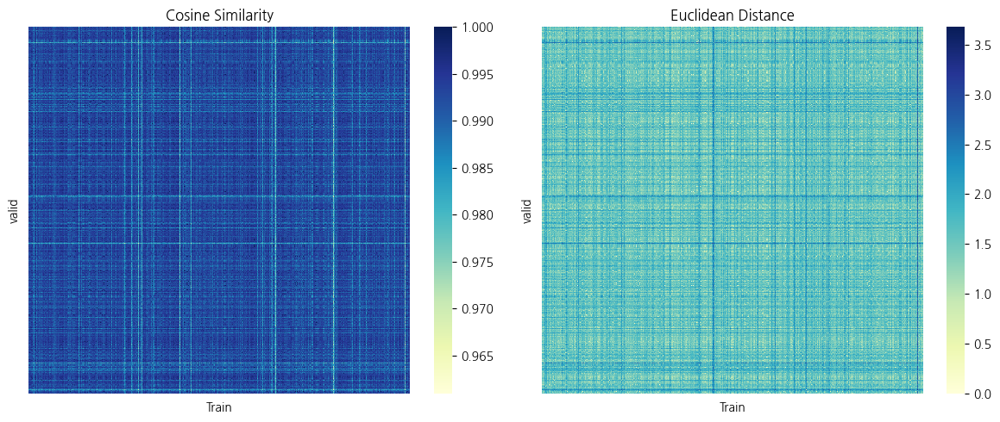

None


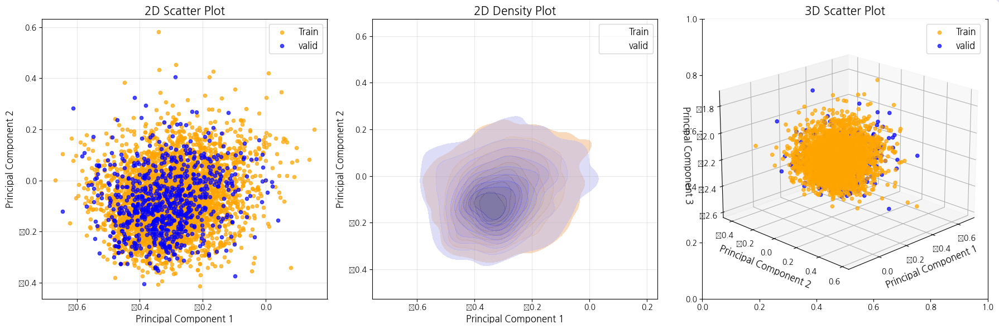

In [146]:
plot_reduced(train_grp, valid_grp, label1="Train", label2="valid")

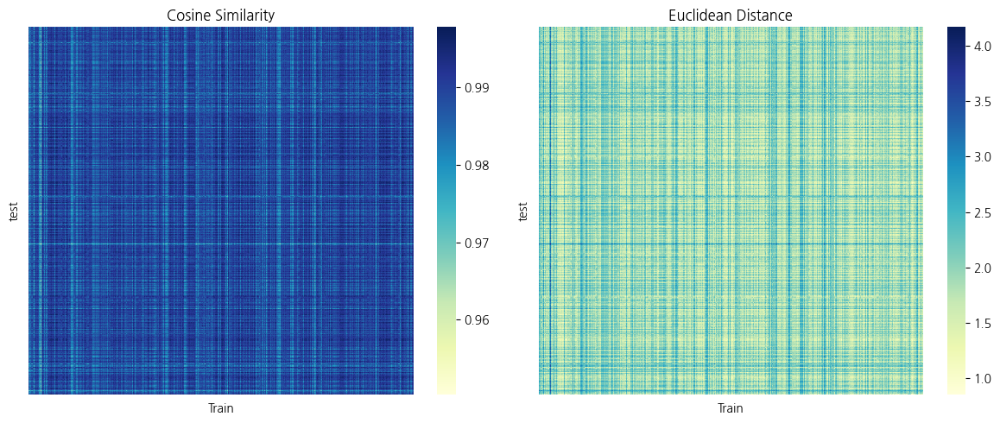

None


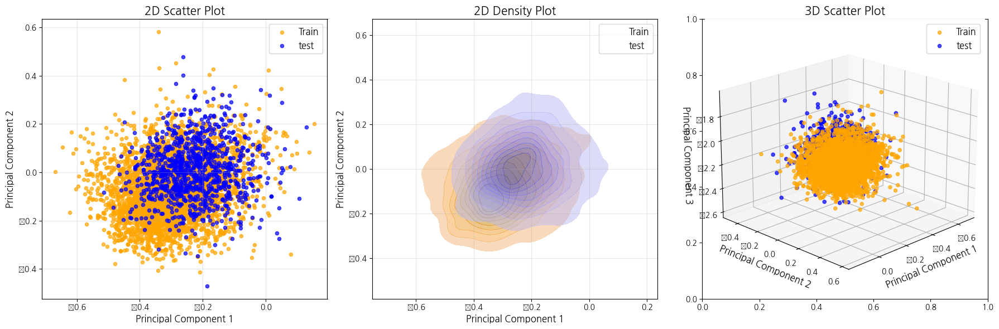

In [147]:
plot_reduced(train_grp, test_grp, label1="Train", label2="test")

#### KStest

In [ ]:
# KS-valid 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_grp, valid_grp, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 valid의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 valid의 분포 차이는 유의미하지 않습니다.")
    
print()

# KS-Test 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_grp, test_grp, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 Test의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 Test의 분포 차이는 유의미하지 않습니다.")

### 4.5 Autoencoder

#### select dim

In [172]:
import torch
from torch import nn
import random

def set_seed(seed):
    """
    난수 고정 함수.
    Parameters:
    - seed (int): 난수 고정을 위한 시드 값.
    """
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, latent_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, input_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

    def fit(self, train_data, epochs=200, lr=0.001, seed=42):
        """
        Autoencoder 학습 함수
        - train_data: 학습 데이터
        - epochs: 학습 에폭 수
        - lr: 학습률
        - seed: 난수 고정을 위한 시드 값
        """
        set_seed(seed)  # 난수 고정

        # 학습 데이터를 텐서로 변환
        train_tensor = torch.tensor(train_data, dtype=torch.float32)

        # 손실 함수 및 옵티마이저 정의
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=lr)

        # 학습 과정
        self.train()
        for epoch in range(epochs):
            optimizer.zero_grad()
            encoded, decoded = self(train_tensor)
            loss = criterion(decoded, train_tensor)
            loss.backward()
            optimizer.step()

            # 진행 상황 출력
            if (epoch + 1) % 100 == 0 or epoch == 0:
                print(f"Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}")
    
    def transform(self, new_data):
        """
        새로운 데이터를 차원 축소
        - new_data: 새로운 입력 데이터
        - 반환값: 차원 축소된 데이터
        """
        new_tensor = torch.tensor(new_data, dtype=torch.float32)

        self.eval()  # 평가 모드로 설정
        with torch.no_grad():
            encoded = self.encoder(new_tensor)
        return encoded.numpy()
    
    def fit_transform(self, train_data, epochs=200, lr=0.001, seed=42):
        """
        학습 후 차원 축소된 데이터 반환
        - train_data: 학습 데이터
        - 반환값: 차원 축소된 데이터
        """
        self.fit(train_data, epochs, lr, seed)
        return self.transform(train_data)
    
    def inverse_transform(self, encoded_data):
        """
        차원 축소된 데이터를 원래 공간으로 복원
        - encoded_data: 차원 축소된 데이터
        - 반환값: 복원된 원래 데이터
        """
        encoded_tensor = torch.tensor(encoded_data, dtype=torch.float32)

        self.eval()
        with torch.no_grad():
            decoded = self.decoder(encoded_tensor)
        return decoded.numpy()


In [ ]:
# Re-import necessary libraries and redefine the setup due to state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import KernelPCA
from sklearn.metrics import pairwise_distances

data = train_embeddings

# Dimensions and storage for metrics
dimensions = range(1, train_embeddings.shape[1]+1)
stress_vals, explained_variance_ratio_vals, reconstruction_error_vals = [], [], []

# High-dimensional distance computation
high_dim_distances = pairwise_distances(data)

# Dimensionality reduction and metric computation
for n in dimensions:
    autoencoder = Autoencoder(input_dim=train_embeddings.shape[1], latent_dim=328)
    reduced_data = autoencoder.fit_transform(data)
    
    # Stress calculation
    low_dim_distances = pairwise_distances(reduced_data)
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Explained Variance Ratio calculation
   # explained_variance_ratio = np.sum(autoencoder.explained_variance_ratio_)
   # explained_variance_ratio_vals.append(explained_variance_ratio)
    
    # Reconstruction Error calculation
    reconstruction_error = np.mean((data - autoencoder.inverse_transform(reduced_data)) ** 2)
    reconstruction_error_vals.append(reconstruction_error)

# Visualization of metrics
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
# plt.plot(dimensions, explained_variance_ratio_vals, label='Explained Variance Ratio', marker='o')
plt.plot(dimensions, reconstruction_error_vals, label='Reconstruction Error', marker='o')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoch [100/200], Loss: 0.2042
Epoch [200/200], Loss: 0.2036
Epoch [1/200], Loss: 0.5354
Epoc

In [ ]:
from kneed import KneeLocator
import pandas as pd

dimensions=range(1, train_embeddings.shape[1]+1)

stress_point = KneeLocator(dimensions, stress_vals, curve="convex", direction="decreasing").knee
# explained_variance_point = KneeLocator(dimensions, explained_variance_ratio_vals, curve="concave", direction="increasing").knee
# explained_variance_point = next((i for i, val in enumerate(explained_variance_ratio_vals) if val > 0.95), None)
reconstruction_error_point = KneeLocator(dimensions, reconstruction_error_vals, curve="convex", direction="decreasing").knee

stress_point, reconstruction_error_point

ValueError: x and y arrays must be equal in length along interpolation axis.

##### before

In [ ]:
# Dataset dictionary
datasets = {
    "Train": train_embeddings,
    "Validation": valid_embeddings,
    "Test": test_embeddings
}

# Reconstruction error calculation and visualization
dims = range(768, 1, -20) 
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for i, (name, data) in enumerate(datasets.items()):
    data_tensor = torch.tensor(data, dtype=torch.float32)
    reconstruction_errors = []

    for dim in dims:
        autoencoder = Autoencoder(input_dim=768, latent_dim=dim)
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)

        # Train the autoencoder
        for epoch in range(10):  # Simplified to 10 epochs for demonstration
            optimizer.zero_grad()
            outputs = autoencoder(data_tensor)
            loss = criterion(outputs, data_tensor)
            loss.backward()
            optimizer.step()

        # Save the reconstruction error
        reconstruction_errors.append(loss.item())

    # Detect elbow point
    kneedle = KneeLocator(dims, reconstruction_errors, curve="convex", direction="decreasing")
    elbow_point = kneedle.knee

    # If the dataset is Train, print the elbow point dimension
    if name == "Train":
        print(f"Elbow Point for Train Dataset: {elbow_point}")

    # Plotting
    axes[i].plot(dims, reconstruction_errors, marker='o', label="Reconstruction Error")
    axes[i].axvline(x=elbow_point, color='r', linestyle='--', label=f"Elbow Point: {elbow_point}")
    axes[i].set_title(f"{name} Dataset")
    axes[i].set_xlabel("Latent Dimension")
    axes[i].set_ylabel("Reconstruction Error")
    axes[i].invert_xaxis()
    axes[i].legend()

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import trustworthiness
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# 예제 데이터 생성
data = train_embeddings

# 지표 저장용 리스트
dimensions = range(1, 768, 5)
stress_vals, pearson_vals, trust_vals, lcmc_vals = [], [], [], []

# 고차원 거리 계산
high_dim_distances = pairwise_distances(data)

# 차원 축소 및 지표 계산
for n in dimensions:
    # 차원 축소
    auto_encoder = Autoencoder(input_dim=768, latent_dim=n)
    reduced_data = auto_encoder.fit_transform(data)

    # 저차원 거리 계산
    low_dim_distances = pairwise_distances(reduced_data)
    
    # Stress 계산
    stress = np.sqrt(np.sum((high_dim_distances - low_dim_distances) ** 2) / 
                     np.sum(high_dim_distances ** 2))
    stress_vals.append(stress)
    
    # Pearson Correlation 계산
    pearson_corr, _ = pearsonr(high_dim_distances.flatten(), low_dim_distances.flatten())
    pearson_vals.append(pearson_corr)

# 결과 시각화
plt.figure(figsize=(12, 8))
plt.plot(dimensions, stress_vals, label='Stress', marker='o')
plt.plot(dimensions, pearson_vals, label='Pearson Correlation', marker='o')
plt.axvline(x=dimensions[np.argmin(stress_vals)], color='r', linestyle='--', label='Elbow Point')
plt.xlabel('Number of Dimensions')
plt.ylabel('Metric Value')
plt.legend()
plt.title('Dimensionality Reduction Evaluation')
plt.show()

In [ ]:
tolerance = 0.001

# Stress 안정 구간 계산
stress_deltas = np.abs(np.diff(stress_vals))
stress_stable_indices = np.where(stress_deltas < tolerance)[0] + 1
stress_stable_range = dimensions[min(stress_stable_indices): max(stress_stable_indices)+1] if len(stress_stable_indices) > 0 else []

# Pearson Correlation 안정 구간 계산
pearson_deltas = np.abs(np.diff(pearson_vals))
pearson_stable_indices = np.where(pearson_deltas < tolerance)[0] + 1
pearson_stable_range = dimensions[min(pearson_stable_indices): max(pearson_stable_indices)+1] if len(pearson_stable_indices) > 0 else []

# 공통적으로 겹치는 차원 구간 계산
common_range = set(stress_stable_range).intersection(
    pearson_stable_range,
)

# 결과 데이터프레임 생성
result_df = pd.DataFrame([
    {"Metric": "Stress", "Stable Range Start": min(stress_stable_range) if stress_stable_range else None,
     "Stable Range End": max(stress_stable_range) if stress_stable_range else None},
    {"Metric": "Pearson Correlation", "Stable Range Start": min(pearson_stable_range) if pearson_stable_range else None,
     "Stable Range End": max(pearson_stable_range) if pearson_stable_range else None},
    {"Metric": "Common Stable Range", "Stable Range Start": min(common_range) if common_range else None,
     "Stable Range End": max(common_range) if common_range else None}
])

result_df

#### excute dimension reduction

In [ ]:
import torch
from torch import nn
import random

def set_seed(seed):
    """
    난수 고정 함수.
    Parameters:
    - seed (int): 난수 고정을 위한 시드 값.
    """
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, latent_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, input_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

    def fit(self, train_data, epochs=200, lr=0.001, seed=42):
        """
        Autoencoder 학습 함수.
        Parameters:
        - train_data (numpy.ndarray): 학습 데이터.
        - epochs (int): 학습 에폭 수.
        - lr (float): 학습률.
        - seed (int): 난수 고정을 위한 시드 값.
        """
        # 난수 고정
        set_seed(seed)

        # Train 데이터 텐서화
        train_tensor = torch.tensor(train_data, dtype=torch.float32)

        # 손실 함수 및 옵티마이저 정의
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=lr)

        # 모델 학습
        self.train()
        for epoch in range(epochs):
            optimizer.zero_grad()
            encoded, decoded = self(train_tensor)
            loss = criterion(decoded, train_tensor)
            loss.backward()
            optimizer.step()

            # 학습 진행 상황 출력
            if (epoch + 1) % 100 == 0 or epoch == 0:
                print(f"Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}")
    
    def transform(self, new_data):
        """
        학습된 Autoencoder 모델을 사용하여 새로운 데이터를 차원 축소.
        Parameters:
        - new_data (numpy.ndarray): 새로운 입력 데이터.

        Returns:
        - numpy.ndarray: 차원 축소된 데이터.
        """
        # 데이터 텐서화
        new_tensor = torch.tensor(new_data, dtype=torch.float32)

        # 차원 축소 수행
        self.eval()  # 평가 모드로 설정
        with torch.no_grad():
            encoded = self.encoder(new_tensor)
        return encoded.numpy()

In [ ]:
autoencoder = Autoencoder(input_dim=train_embeddings.shape[1], latent_dim=328)
autoencoder.fit(train_embeddings)

train_autoencoder = autoencoder.transform(train_embeddings)
valid_autoencoder = autoencoder.transform(valid_embeddings)
test_autoencoder = autoencoder.transform(test_embeddings)

In [ ]:
plot_reduced(train_autoencoder, valid_autoencoder, label1="Train", label2="valid")

In [ ]:
plot_reduced(train_autoencoder, test_autoencoder, label1="Train", label2="test")

#### KStest

In [ ]:
# KS-valid 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_autoencoder, valid_autoencoder, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 valid의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 valid의 분포 차이는 유의미하지 않습니다.")

print()

# KS-Test 실행 (첫 번째 주성분 비교)
ks_stat, p_val = run_kstest(train_autoencoder, test_autoencoder, feature_idx=0)
print(f"KS Statistic: {ks_stat:.3f}, P-value: {p_val:.3f}")

# 결과 해석
if p_val < 0.05:
    print("Train과 Test의 분포가 유의미하게 다릅니다.")
else:
    print("Train과 Test의 분포 차이는 유의미하지 않습니다.")

## 5. evaluation function

In [ ]:
train_data = {
    "PCA": train_pca,
    "Kernel PCA": train_kernel_pca,
    "SVD": train_svd,
    "GRP": train_grp,
    "AutoEncoder": train_autoencoder,
}
valid_data = {
    "PCA": valid_pca,
    "Kernel PCA": valid_kernel_pca,
    "SVD": valid_svd,
    "GRP": valid_grp,
    "AutoEncoder": valid_autoencoder,
}
test_data = {
    "PCA": test_pca,
    "Kernel PCA": test_kernel_pca,
    "SVD": test_svd,
    "GRP": test_grp,
    "AutoEncoder": test_autoencoder,
}

### Global

In [ ]:
# Shepard Diagram (Stress) - 전역 구조
from sklearn.metrics import pairwise_distances

def calculate_stress(original_data, reduced_data):
    
    original_distances = pairwise_distances(original_data, metric='euclidean')
    reduced_distances = pairwise_distances(reduced_data, metric='euclidean')
    
    # 고차원과 저차원의 거리 차이의 제곱합 계산
    numerator = np.sum((original_distances - reduced_distances) ** 2)
    denominator = np.sum(original_distances ** 2)
    
    stress = np.sqrt(numerator / denominator)
    return round(stress, 4)


# Function to calculate preservation scores for all methods
def Evaluation_STRESS(original_embeddings, reduced_embeddings_dict):
    scores = {}
    for method, reduced_embeddings in reduced_embeddings_dict.items():
        scores[method] = calculate_stress(original_embeddings, reduced_embeddings)
    return scores

# Calculate scores for train, valid, and test sets
train_scores = Evaluation_STRESS(train_embeddings, train_data)
valid_scores = Evaluation_STRESS(valid_embeddings, valid_data)
test_scores = Evaluation_STRESS(test_embeddings, test_data)

# Create a DataFrame to store results
results_df = pd.DataFrame([train_scores, valid_scores, test_scores], index=["train", "valid", "test"])
results_df

In [ ]:
# pearson - 전역 구조

from sklearn.metrics import pairwise_distances
from scipy.stats import pearsonr

def calculate_pearson(original_data, reduced_data):
    # 원본 데이터와 축소 데이터의 거리 행렬 계산
    original_distances = pairwise_distances(original_data, metric='euclidean')
    reduced_distances = pairwise_distances(reduced_data, metric='euclidean')

    # 1차원으로 펼치고 피어슨 상관계수 계산
    correlation, _ = pearsonr(original_distances.ravel(), reduced_distances.ravel())
    return round(correlation, 4)

# Function to calculate preservation scores for all methods
def Evaluation_pear(original_embeddings, reduced_embeddings_dict):
    scores = {}
    for method, reduced_embeddings in reduced_embeddings_dict.items():
        scores[method] = calculate_pearson(original_embeddings, reduced_embeddings)
    return scores

# Calculate scores for train, valid, and test sets
train_scores = Evaluation_pear(train_embeddings, train_data)
valid_scores = Evaluation_pear(valid_embeddings, valid_data)
test_scores = Evaluation_pear(test_embeddings, test_data)

# Create a DataFrame to store results
results_df = pd.DataFrame([train_scores, valid_scores, test_scores], index=["train", "valid", "test"])
results_df

### Local

In [ ]:
# Trustworthiness - 국소 구조
from sklearn.manifold import trustworthiness

def calculate_trustworthiness(original_data, reduced_data, k=200):
    
    k_trustworthiness = trustworthiness(original_data, reduced_data, n_neighbors=k)
    
    return round(k_trustworthiness, 4)

# Function to calculate preservation scores for all methods
def Evaluation_TW(original_embeddings, reduced_embeddings_dict):
    scores = {}
    for method, reduced_embeddings in reduced_embeddings_dict.items():
        scores[method] = calculate_trustworthiness(original_embeddings, reduced_embeddings)
    return scores

# Calculate scores for train, valid, and test sets
train_scores = Evaluation_TW(train_embeddings, train_data)
valid_scores = Evaluation_TW(valid_embeddings, valid_data)
test_scores = Evaluation_TW(test_embeddings, test_data)

# Create a DataFrame to store results
results_df = pd.DataFrame([train_scores, valid_scores, test_scores], index=["train", "valid", "test"])
results_df

In [ ]:
# Local Continuity Meta-Criterion - 국소구조
from sklearn.metrics import pairwise_distances

def calculate_lcmc(original_data, reduced_data, k=200):
    
    n = original_data.shape[0]  # 데이터 샘플 개수

    # 1. 고차원 데이터와 저차원 데이터의 거리 행렬 계산
    original_distances = pairwise_distances(original_data, metric='euclidean')
    reduced_distances = pairwise_distances(reduced_data, metric='euclidean')

    # 2. k개의 최근접 이웃 구하기 (자기 자신 제외)
    original_neighbors = np.argsort(original_distances, axis=1)[:, 1:k+1]
    reduced_neighbors = np.argsort(reduced_distances, axis=1)[:, 1:k+1]

    # 3. 공유된 이웃 계산
    shared_neighbors = [
        len(set(original_neighbors[i]) & set(reduced_neighbors[i])) for i in range(n)
    ]
    shared_ratio = np.sum(shared_neighbors) / (n * k)

    # 4. LCMC 점수 계산
    lcmc_score = 1 - shared_ratio + (k / n)

    return round(lcmc_score, 4)

# Function to calculate preservation scores for all methods
def Evaluation_LCMC(original_embeddings, reduced_embeddings_dict):
    scores = {}
    for method, reduced_embeddings in reduced_embeddings_dict.items():
        scores[method] = calculate_lcmc(original_embeddings, reduced_embeddings)
    return scores

# Calculate scores for train, valid, and test sets
train_scores = Evaluation_LCMC(train_embeddings, train_data)
valid_scores = Evaluation_LCMC(valid_embeddings, valid_data)
test_scores = Evaluation_LCMC(test_embeddings, test_data)

# Create a DataFrame to store results
results_df = pd.DataFrame([train_scores, valid_scores, test_scores], index=["train", "valid", "test"])
results_df